In [ ]:
import numpy as np
import xarray as xr
from pathlib import Path
import os.path
import sys
import pandas as pd 
from scipy.stats import linregress
from eofs.xarray import Eof

import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
#from matplotlib.colors import TwoslopeNorm
from matplotlib.ticker import FuncFormatter
from matplotlib.colors import ListedColormap
import matplotlib.dates as mdates
from matplotlib.lines import Line2D
from matplotlib.ticker import MaxNLocator
import matplotlib.ticker as mticker

import cartopy.crs as ccrs
import cartopy.mpl.ticker as cticker
from cartopy.util import add_cyclic_point
import cftime
import cartopy.feature as cfeature

import geocat.comp as gcomp

import corrector_scripts.corrector_analysis as corrtools

plt.rcParams['font.size'] = '12'

In [2]:
import importlib
importlib.reload(corrtools)

<module 'corrector_scripts.corrector_analysis' from '/n/home04/sweidman/mean_state_corrector/corrector_scripts/corrector_analysis.py'>

In [3]:
fig_dir = Path().cwd() / 'figs_corrector_paper'

In [4]:
def cmap_white_center(levels, pycmap="RdBu_r"):
    
    """Create a colormap with the two intervals nearest zero white."""
    levels = np.asarray(levels)
    n_intervals = len(levels) - 1
    colors = plt.colormaps[pycmap].resampled(n_intervals)(np.arange(n_intervals))

    interval_midpoints = 0.5 * (levels[:-1] + levels[1:])
    white_indices = np.argsort(np.abs(interval_midpoints))[:2]
    colors[white_indices] = [1, 1, 1, 1]

    cmap = ListedColormap(colors)
    cmap.set_under(plt.colormaps[pycmap](0.))
    cmap.set_over(plt.colormaps[pycmap](1.))
    return cmap

# Figure 1: Zonal mean bias

In [5]:
def plot_lat_vs_level_bias(cases, case_names, merra_var, output_path):
    """Generates a 3x3 latitude-vertical cross-section of state variable biases."""
    
    fig, ax = plt.subplots(3, 3, figsize=(10, 8), sharex=True, sharey=True)
    
    clevu = np.arange(-5, 5.1, 0.5)
    clevv = np.arange(-1,1.1,.1)
    clevq = np.arange(-0.5, 0.55, .05)
    clevt = np.arange(-4,4.5,.5)

    merra_latave = corrtools.take_spatial_average_xr(merra_var, orientation='lon')

    has_lev = 'lev' in merra_latave.dims
    vert_coord = merra_latave.lev if has_lev else merra_latave.plev

    for idx,case in enumerate(cases):
        bias_var_latave = corrtools.take_spatial_average_xr(case, orientation='lon')

        # Var1: U
        e = ax[0,idx].contourf(bias_var_latave.lat, vert_coord, corrtools.weighted_monthly_mean(bias_var_latave.U),
                             levels=clevu, cmap=cmap_white_center(clevu), extend='both', norm=mcolors.TwoSlopeNorm(0))
        ax[0,idx].contour(merra_latave.lat, vert_coord, corrtools.weighted_monthly_mean(merra_latave.U), colors='grey')
        ax[0,idx].set_title(case_names[idx])

        # Var2: V
        g = ax[1,idx].contourf(bias_var_latave.lat, vert_coord, corrtools.weighted_monthly_mean(bias_var_latave.V),
                             levels=clevv, cmap=cmap_white_center(clevv), extend='both', norm=mcolors.TwoSlopeNorm(0))
        ax[1,idx].contour(merra_latave.lat, vert_coord, corrtools.weighted_monthly_mean(merra_latave.V), colors='grey')

        # Var2: Q
        h = ax[2,idx].contourf(bias_var_latave.lat, vert_coord, corrtools.weighted_monthly_mean(bias_var_latave.Q)*1000,
                             levels=clevq, cmap=cmap_white_center(clevq), extend='both', norm=mcolors.TwoSlopeNorm(0))
        ax[2,idx].contour(merra_latave.lat, vert_coord, corrtools.weighted_monthly_mean(merra_latave.Q)*1000, colors='grey')

    cax_1 = fig.add_axes([0.92, 0.65, 0.02, 0.22])
    cbar = fig.colorbar(e, cax=cax_1, label='m/s')

    cax_2 = fig.add_axes([0.92, 0.39, 0.02, 0.22])
    cbar = fig.colorbar(g, cax=cax_2, label='m/s')

    cax_3 = fig.add_axes([0.92, 0.12, 0.02, 0.22])
    cbar = fig.colorbar(h, cax=cax_3, label='g/kg')

    ax[0,0].invert_yaxis()
    ax[0, 0].set_ylabel("U bias", fontsize=14, labelpad=10)
    ax[0, 0].text(-0.22, 0.5, "hPa",transform=ax[0, 0].transAxes,rotation=90,ha="center",va="center")
    ax[1, 0].set_ylabel("V bias", fontsize=14, labelpad=10)
    ax[1, 0].text(-0.22, 0.5, "hPa",transform=ax[1, 0].transAxes,rotation=90,ha="center",va="center")
    ax[2, 0].set_ylabel("Q bias", fontsize=14, labelpad=10)
    ax[2, 0].text(-0.22, 0.5, "hPa",transform=ax[2, 0].transAxes,rotation=90,ha="center",va="center")
    #ax[0,0].set_ylabel('U bias\nhPa')
    #ax[1,0].set_ylabel('V bias\nhPa')
    #ax[2,0].set_ylabel('Q bias\nhPa')

    ax[2,1].set_xlabel('Latitude')

    fig.subplots_adjust(hspace=0.1, wspace=0.1)
        
    #fig.suptitle(f'Bias: {case_name}', y=.95)
    fig.savefig(output_path, bbox_inches='tight', dpi=300)
    plt.show()

In [127]:
def plot_lat_vs_level_bias_uvtq(cases, case_names, merra_var, output_path):
    """Generates a 3x3 latitude-vertical cross-section of state variable biases."""
    
    fig, ax = plt.subplots(4, 3, figsize=(10, 10), sharex=True, sharey=True)
    
    clevu = np.arange(-5, 5.1, 0.5)
    clevv = np.arange(-1,1.1,.1)
    clevq = np.arange(-0.5, 0.55, .05)
    clevt = np.arange(-4,4.5,.5)

    merra_latave = corrtools.take_spatial_average_xr(merra_var, orientation='lon')

    has_lev = 'lev' in merra_latave.dims
    vert_coord = merra_latave.lev if has_lev else merra_latave.plev

    for idx,case in enumerate(cases):
        bias_var_latave = corrtools.take_spatial_average_xr(case, orientation='lon')

        # Var1: U
        e = ax[0,idx].contourf(bias_var_latave.lat, vert_coord, corrtools.weighted_monthly_mean(bias_var_latave.U),
                             levels=clevu, cmap=cmap_white_center(clevu), extend='both', norm=mcolors.TwoSlopeNorm(0))
        ax[0,idx].contour(merra_latave.lat, vert_coord, corrtools.weighted_monthly_mean(merra_latave.U), colors='grey')
        ax[0,idx].set_title(case_names[idx])

        # Var2: V
        g = ax[1,idx].contourf(bias_var_latave.lat, vert_coord, corrtools.weighted_monthly_mean(bias_var_latave.V),
                             levels=clevv, cmap=cmap_white_center(clevv), extend='both', norm=mcolors.TwoSlopeNorm(0))
        ax[1,idx].contour(merra_latave.lat, vert_coord, corrtools.weighted_monthly_mean(merra_latave.V), colors='grey')

        # Var2: Q
        h = ax[2,idx].contourf(bias_var_latave.lat, vert_coord, corrtools.weighted_monthly_mean(bias_var_latave.Q)*1000,
                             levels=clevq, cmap=cmap_white_center(clevq), extend='both', norm=mcolors.TwoSlopeNorm(0))
        ax[2,idx].contour(merra_latave.lat, vert_coord, corrtools.weighted_monthly_mean(merra_latave.Q)*1000, colors='grey')

        # Var4: T
        h = ax[3,idx].contourf(bias_var_latave.lat, vert_coord, corrtools.weighted_monthly_mean(bias_var_latave.T),
                             levels=clevt, cmap=cmap_white_center(clevt), extend='both', norm=mcolors.TwoSlopeNorm(0))
        ax[3,idx].contour(merra_latave.lat, vert_coord, corrtools.weighted_monthly_mean(merra_latave.T), colors='grey')

    cax_1 = fig.add_axes([0.92, 0.7, 0.02, 0.18])
    cbar = fig.colorbar(e, cax=cax_1, label='m/s')

    cax_2 = fig.add_axes([0.92, 0.505, 0.02, 0.18])
    cbar = fig.colorbar(g, cax=cax_2, label='m/s')

    cax_3 = fig.add_axes([0.92, 0.305, 0.02, 0.18])
    cbar = fig.colorbar(h, cax=cax_3, label='g/kg')

    cax_4 = fig.add_axes([0.92, 0.11, 0.02, 0.18])
    cbar = fig.colorbar(h, cax=cax_4, label='K')

    ax[0,0].invert_yaxis()
    ax[0, 0].set_ylabel("U bias", fontsize=14, labelpad=10)
    ax[0, 0].text(-0.22, 0.5, "hPa",transform=ax[0, 0].transAxes,rotation=90,ha="center",va="center")
    ax[1, 0].set_ylabel("V bias", fontsize=14, labelpad=10)
    ax[1, 0].text(-0.22, 0.5, "hPa",transform=ax[1, 0].transAxes,rotation=90,ha="center",va="center")
    ax[2, 0].set_ylabel("Q bias", fontsize=14, labelpad=10)
    ax[2, 0].text(-0.22, 0.5, "hPa",transform=ax[2, 0].transAxes,rotation=90,ha="center",va="center")
    ax[3, 0].set_ylabel("T bias", fontsize=14, labelpad=10)
    ax[3, 0].text(-0.22, 0.5, "hPa",transform=ax[3, 0].transAxes,rotation=90,ha="center",va="center")
    #ax[0,0].set_ylabel('U bias\nhPa')
    #ax[1,0].set_ylabel('V bias\nhPa')
    #ax[2,0].set_ylabel('Q bias\nhPa')

    ax[3,1].set_xlabel('Latitude')

    fig.subplots_adjust(hspace=0.1, wspace=0.1)
        
    #fig.suptitle(f'Bias: {case_name}', y=.95)
    fig.savefig(output_path, bbox_inches='tight', dpi=300)
    plt.show()

In [13]:
control_case = 'cam_control_6hr'
nudge_case = 'nudge30_coef_1'; iteration='iter9'
corrected_case = 'apply_nudge30_coef_1'
case_names = ['Control','Converged\nNudging','Corrected']

In [95]:
ANALYSIS_YEARS = np.arange(1980,2010)
REGRID=True; EXTRAP=False
DO_SURFACE=False
DO_TOA=False

In [96]:
control_dir = f'/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/{control_case}/atm/hist/{control_case}'
nudge_dir = f'/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/{nudge_case}/atm/hist/{iteration}/{nudge_case}'
corrected_dir = f'/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/{corrected_case}/atm/hist/{iteration}/{corrected_case}'
MERRA_DIR = '/n/home04/sweidman/holylfs06/MERRA2_OG/MERRA2_f19/'; CLIMO="monave30"

In [126]:
MONTHS = [12,1,2]; TIME_LABEL='DJF'
control_ds, control_diff, control_interp, merra_ds, pr_diff = corrtools.calculate_bias_ds(control_dir, MERRA_DIR, ANALYSIS_YEARS, MONTHS, CLIMO, REGRID, DO_SURFACE, DO_TOA, EXTRAP)
nudge_ds, nudge_diff, nudge_interp, merra_ds, pr_diff = corrtools.calculate_bias_ds(nudge_dir, MERRA_DIR, ANALYSIS_YEARS, MONTHS, CLIMO, REGRID, DO_SURFACE, DO_TOA, EXTRAP)
corrected_ds, corrected_diff, corrected_interp, merra_ds, pr_diff = corrtools.calculate_bias_ds(corrected_dir, MERRA_DIR, ANALYSIS_YEARS, MONTHS, CLIMO, REGRID, DO_SURFACE, DO_TOA, EXTRAP)
cases = [control_diff, nudge_diff, corrected_diff]

/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/cam_control_6hr/atm/hist/cam_control_6hr


regrid model to plev


regrid MERRA to plev


Mean precip bias 0.057282010417172784
% diff 0.025542311166176078
/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/nudge30_coef_1/atm/hist/iter9/nudge30_coef_1


regrid model to plev


regrid MERRA to plev


Mean precip bias -0.012770509252643985
% diff -0.0056944286470744085
/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/apply_nudge30_coef_1/atm/hist/iter9/apply_nudge30_coef_1


regrid model to plev


regrid MERRA to plev


Mean precip bias -0.014437319314569319
% diff -0.006437666898430311


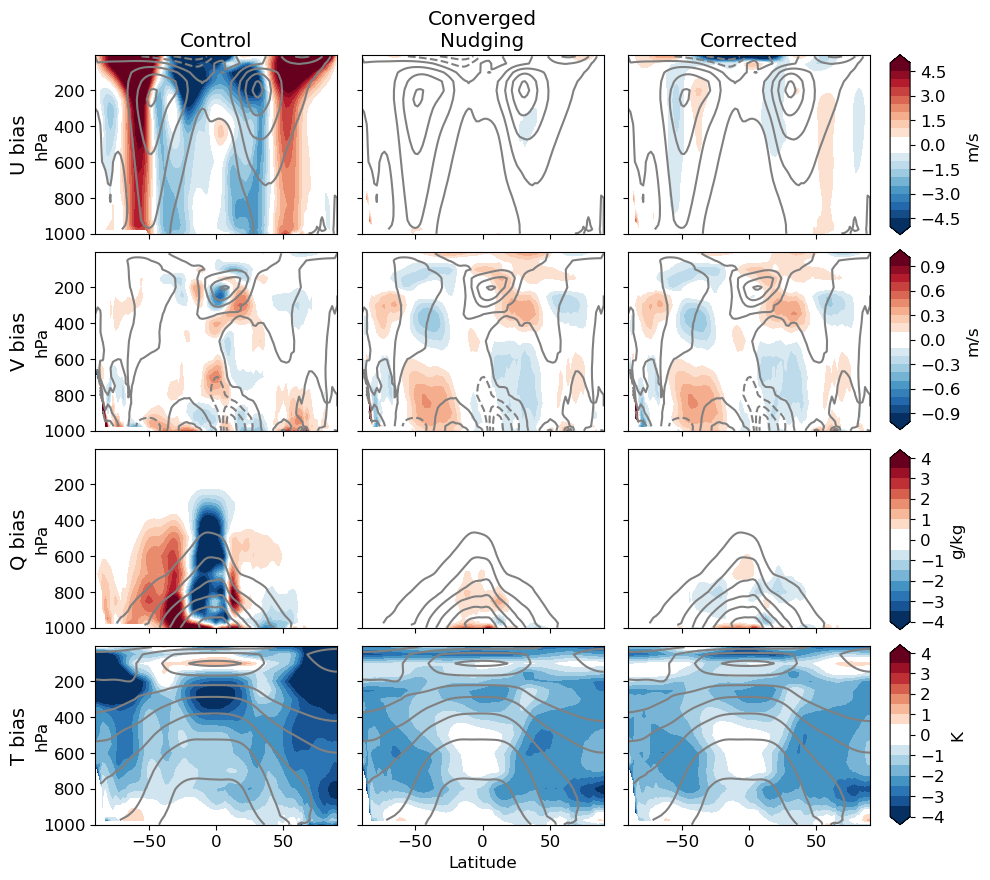

In [128]:
plot_lat_vs_level_bias_uvtq(cases, case_names, merra_ds, fig_dir / f'{TIME_LABEL}_latxlev_uvqt.png')

In [129]:
MONTHS = [6,7,8]; TIME_LABEL='JJA'
control_ds, control_diff, control_interp, merra_ds, pr_diff = corrtools.calculate_bias_ds(control_dir, MERRA_DIR, ANALYSIS_YEARS, MONTHS, CLIMO, REGRID, DO_SURFACE, DO_TOA, EXTRAP)
nudge_ds, nudge_diff, nudge_interp, merra_ds, pr_diff = corrtools.calculate_bias_ds(nudge_dir, MERRA_DIR, ANALYSIS_YEARS, MONTHS, CLIMO, REGRID, DO_SURFACE, DO_TOA, EXTRAP)
corrected_ds, corrected_diff, corrected_interp, merra_ds, pr_diff = corrtools.calculate_bias_ds(corrected_dir, MERRA_DIR, ANALYSIS_YEARS, MONTHS, CLIMO, REGRID, DO_SURFACE, DO_TOA, EXTRAP)
cases = [control_diff, nudge_diff, corrected_diff]

/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/cam_control_6hr/atm/hist/cam_control_6hr


regrid model to plev


regrid MERRA to plev


Mean precip bias 0.03494229042254314
% diff 0.01424071507188492
/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/nudge30_coef_1/atm/hist/iter9/nudge30_coef_1


regrid model to plev


regrid MERRA to plev


Mean precip bias -0.03215312830870881
% diff -0.01310399328083754
/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/apply_nudge30_coef_1/atm/hist/iter9/apply_nudge30_coef_1


regrid model to plev


regrid MERRA to plev


Mean precip bias -0.03693186949511161
% diff -0.015051567146629096


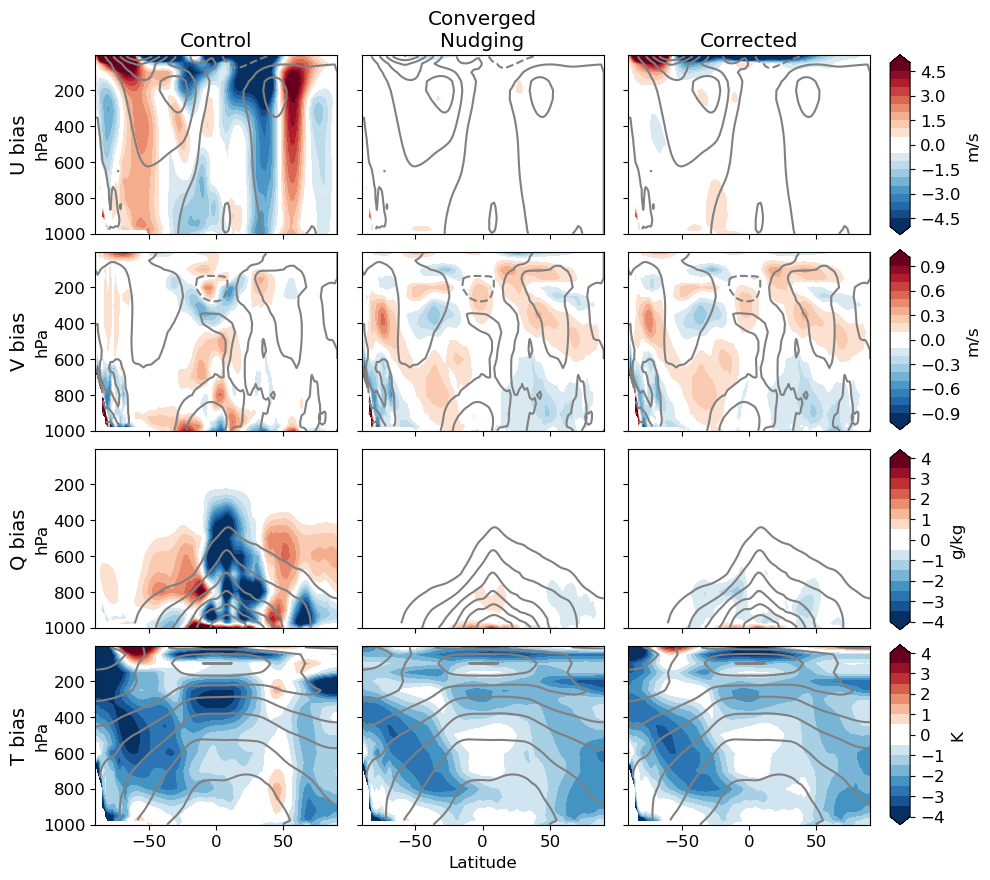

In [130]:
plot_lat_vs_level_bias_uvtq(cases, case_names, merra_ds, fig_dir / f'{TIME_LABEL}_latxlev_uvqt.png')

# Figure 2: horizontal mean bias

In [35]:
def _select_vertical_level(field, level):
    """Select the nearest pressure level when requested."""
    if level is None:
        return field.squeeze(drop=True)
    if "lev" in field.dims:
        return field.sel(lev=level, method="nearest").squeeze(drop=True)
    if "plev" in field.dims:
        return field.sel(plev=level, method="nearest").squeeze(drop=True)
    raise ValueError(f"Level {level} requested for {field.name!r}, but it has no 'lev' or 'plev' dimension.")


def plot_lat_vs_lon_bias_comparison(cases, merra_var, plot_configs, output_path):

    case_names = list(cases)
    panels = [(var, level) for var, config in plot_configs.items() for level in config["levels"]]
    nrows, ncols = len(case_names), len(panels)
    projection, data_crs = ccrs.PlateCarree(central_longitude=180), ccrs.PlateCarree()

    fig, axes = plt.subplots(nrows, ncols,figsize=(12, 4.5),subplot_kw={"projection": projection})
    xticks = np.arange(-180, 181, 60) 
    yticks = np.arange(-60, 61, 30)

    contour_sets = {}

    for row, case_name in enumerate(case_names):
        
        bias_ds = cases[case_name]

        for col, (var, level) in enumerate(panels):
            
            ax, config = axes[row, col], plot_configs[var]
            cmap = cmap_white_center(config["clev"])

            bias_field = _select_vertical_level(corrtools.weighted_monthly_mean(bias_ds[var]), level)
            reference_field = _select_vertical_level(corrtools.weighted_monthly_mean(merra_var[var]), level)
            
            bias_cyclic, bias_lons = add_cyclic_point(bias_field.values, coord=bias_field.lon.values)
            ref_cyclic, ref_lons = add_cyclic_point(reference_field.values, coord=reference_field.lon.values)

            filled = ax.contourf(bias_lons, bias_field.lat, bias_cyclic, levels=config["clev"], cmap=cmap,
                                 extend="both", transform=data_crs)
            ax.contour(ref_lons, reference_field.lat, ref_cyclic, colors='grey', transform=data_crs)
            contour_sets[col] = filled

            ax.coastlines()
            ax.set_xticks(xticks, crs=data_crs)
            ax.set_yticks(yticks, crs=data_crs)
            ax.xaxis.set_major_formatter(cticker.LongitudeFormatter())
            ax.yaxis.set_major_formatter(cticker.LatitudeFormatter())

            ax.tick_params(axis="x",which="both",bottom=True,top=False,labelbottom=(row == nrows - 1),labelsize=10)
            ax.tick_params(axis="y",which="both",left=True,right=False,labelleft=(col == 0),labelsize=10)

            if row == 0:
                title = config.get("title", var)
                ax.set_title(f"{title} {level:g} hPa" if level is not None else title,fontsize=12)

            if col == 0:
                ax.text(-0.2, 0.5, case_name, transform=ax.transAxes, rotation=90, ha="center", va="center")

    fig.subplots_adjust(hspace=0.1, wspace=0.1, bottom=0.18)
    
    for col, (var, level) in enumerate(panels):
        bottom_ax = axes[-1, col]
        pos = bottom_ax.get_position()
        cax = fig.add_axes([pos.x0, pos.y0 - 0.1, pos.width, 0.025])
        cbar = fig.colorbar(contour_sets[col], cax=cax, orientation="horizontal",label=plot_configs[var]["clab"])
        cbar.ax.tick_params(labelsize=10)

    fig.savefig(output_path, bbox_inches="tight", dpi=300)
    #plt.close(fig)

In [132]:
control_case = 'cam_control'
corrected_case = 'apply_nudge30_coef_1'; iteration='iter9'
case_names = ['Control','Corrected']

In [133]:
control_dir = f'/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/{control_case}/atm/hist/{control_case}'
corrected_dir = f'/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/{corrected_case}/atm/hist/{iteration}/{corrected_case}'
MERRA_DIR = '/n/home04/sweidman/holylfs06/MERRA2_OG/MERRA2_f19/'; CLIMO="monave30"

In [134]:
ANALYSIS_YEARS = np.arange(1980,2010)
REGRID=True; EXTRAP=False
DO_SURFACE=True
DO_TOA=False

plot_configs = {'U': {'clev': np.arange(-10, 10.1, 1.),
                      'clab': '[m/s]','levels': [250]},
                'V': {'clev': np.arange(-3, 3.1, 0.3),
                      'clab': '[m/s]','levels': [850]},
                'TMQ': {'clev': np.arange(-10, 10.1, 1.),
                      'clab': '[kg m-2]','levels': [None]}}

In [135]:
MONTHS = [12,1,2]; TIME_LABEL='DJF'
control_ds, control_diff, control_interp, merra_ds, pr_diff = corrtools.calculate_bias_ds(control_dir, MERRA_DIR, ANALYSIS_YEARS, MONTHS, CLIMO, REGRID, DO_SURFACE, DO_TOA, EXTRAP)
corrected_ds, corrected_diff, corrected_interp, merra_ds, pr_diff = corrtools.calculate_bias_ds(corrected_dir, MERRA_DIR, ANALYSIS_YEARS, MONTHS, CLIMO, REGRID, DO_SURFACE, DO_TOA, EXTRAP)
cases = {"Control": control_diff, "Corrected": corrected_diff}

/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/cam_control/atm/hist/cam_control


regrid model to plev


regrid MERRA to plev


Mean precip bias 0.057282010417172784
% diff 0.025542311166176078
/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/cam_control/atm/hist/cam_control
/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/cam_control/atm/hist/cam_control


/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/cam_control/atm/hist/cam_control


regrid model to plev


Mean MERRA precip bias 0.1265234797398992
/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/apply_nudge30_coef_1/atm/hist/iter9/apply_nudge30_coef_1


regrid model to plev


regrid MERRA to plev


Mean precip bias -0.014437319314569319
% diff -0.006437666898430311
/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/apply_nudge30_coef_1/atm/hist/iter9/apply_nudge30_coef_1


/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/apply_nudge30_coef_1/atm/hist/iter9/apply_nudge30_coef_1


regrid model to plev


Mean MERRA precip bias 0.056078688021963675


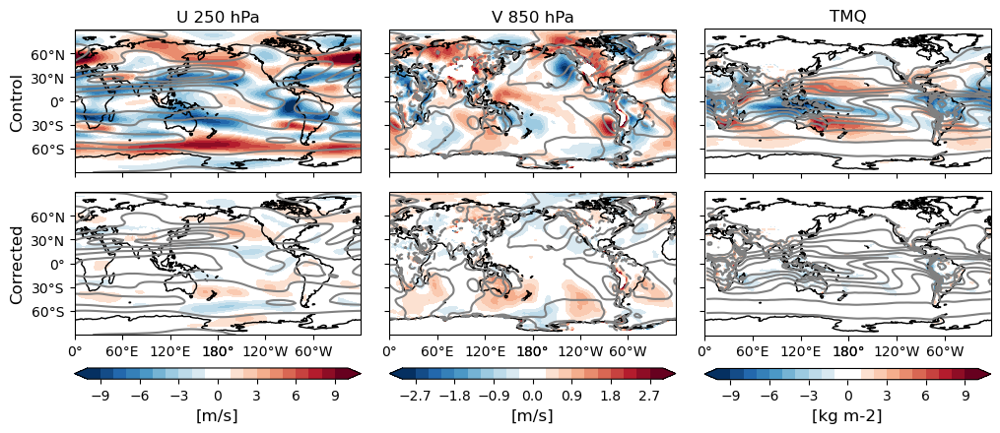

In [138]:
plot_lat_vs_lon_bias_comparison(cases, merra_ds, plot_configs, fig_dir / f'{TIME_LABEL}_lonxlat_uvtmq.png')

In [139]:
MONTHS = [6,7,8]; TIME_LABEL='JJA'
control_ds, control_diff, control_interp, merra_ds, pr_diff = corrtools.calculate_bias_ds(control_dir, MERRA_DIR, ANALYSIS_YEARS, MONTHS, CLIMO, REGRID, DO_SURFACE, DO_TOA)
corrected_ds, corrected_diff, corrected_interp, merra_ds, pr_diff = corrtools.calculate_bias_ds(corrected_dir, MERRA_DIR, ANALYSIS_YEARS, MONTHS, CLIMO, REGRID, DO_SURFACE, DO_TOA)
cases = {"Control": control_diff, "Corrected": corrected_diff}

/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/cam_control/atm/hist/cam_control


regrid model to plev


regrid MERRA to plev


Mean precip bias 0.03494229042254314
% diff 0.01424071507188492
/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/cam_control/atm/hist/cam_control
/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/cam_control/atm/hist/cam_control


/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/cam_control/atm/hist/cam_control


regrid model to plev


Mean MERRA precip bias 0.16907716609924608
/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/apply_nudge30_coef_1/atm/hist/iter9/apply_nudge30_coef_1


regrid model to plev


regrid MERRA to plev


Mean precip bias -0.03693186949511161
% diff -0.015051567146629096
/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/apply_nudge30_coef_1/atm/hist/iter9/apply_nudge30_coef_1


/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/apply_nudge30_coef_1/atm/hist/iter9/apply_nudge30_coef_1


regrid model to plev


Mean MERRA precip bias 0.09787080114274209


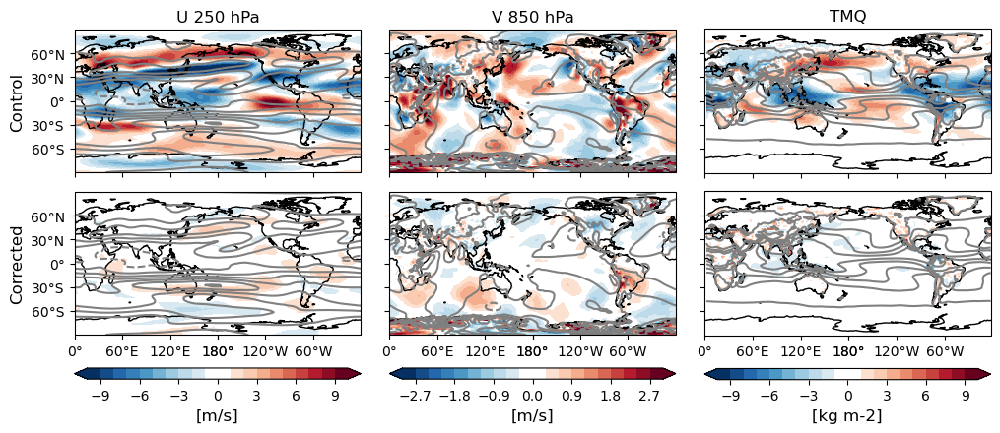

In [140]:
plot_lat_vs_lon_bias_comparison(cases, merra_ds, plot_configs, fig_dir / f'{TIME_LABEL}_lonxlat_uvtmq.png')

# Figure 3,4: Compare normalized bias

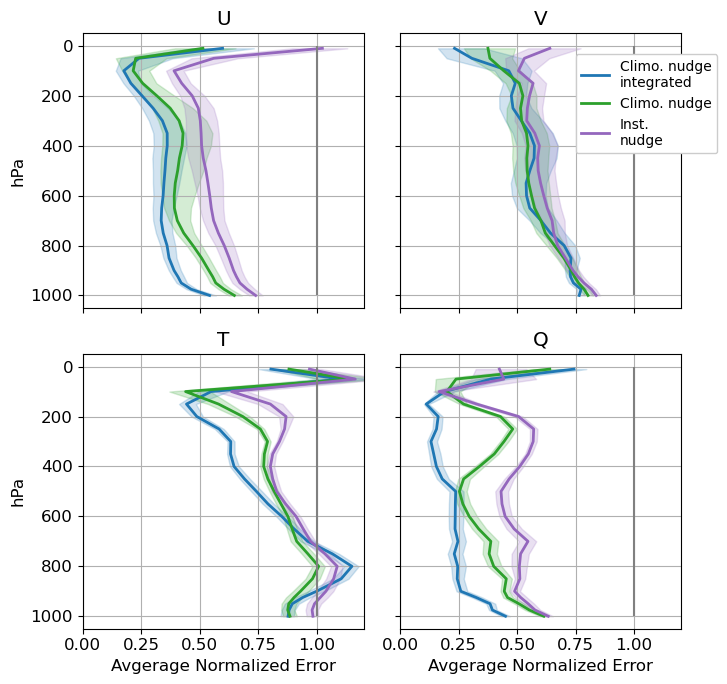

In [321]:
# plot 3 datasets
fig, axs = plt.subplots(2, 2, figsize=(7.5, 7), sharey=True, sharex=True)
time_period = 'DJF'; bbox = (.6,.95)
#time_period = 'JJA'; bbox = (.65,.95)

bs_uvq = xr.open_dataset(fig_dir / f'apply_nudge30_uvq_{time_period}.nc')
bs_cabcor = xr.open_dataset(fig_dir / f'apply_nudge30_integrate_false_{time_period}.nc')
bs_norun = xr.open_dataset(fig_dir / f'apply_nudge_control_norun_uvq_{time_period}.nc')

variables = ['U', 'V', 'T', 'Q']
colors = ['tab:blue','tab:green','tab:purple']
linetypes = ['-','--',':','-.']
linewidths = [2,2,2]
axs = axs.flatten()

for i, var in enumerate(variables):

    ax = axs[i]

    ax.plot(bs_uvq[var+'_median'], bs_uvq.plev, linestyle='-', color=colors[0], 
            linewidth=2, label="Climo. nudge\nintegrated")
    ax.fill_betweenx(bs_uvq.plev, bs_uvq[var+'_q5'], bs_uvq[var+'_q95'], alpha=0.2, color=colors[0])

    ax.plot(bs_cabcor[var+'_median'], bs_cabcor.plev, linestyle='-', color=colors[1], 
            linewidth=2, label="Climo. nudge")
    ax.fill_betweenx(bs_cabcor.plev, bs_cabcor[var+'_q5'], bs_cabcor[var+'_q95'], alpha=0.2, color=colors[1])

    ax.plot(bs_norun[var+'_median'], bs_norun.plev, linestyle='-', color=colors[2], 
            linewidth=2, label="Inst.\nnudge")
    ax.fill_betweenx(bs_norun.plev, bs_norun[var+'_q5'], bs_norun[var+'_q95'], alpha=0.2, color=colors[2])

    ax.vlines(1, 0, 1000, 'grey','solid')
    ax.set_title(var)
    if i%2==0:
        ax.set_ylabel('hPa')
    if i>1:
        ax.set_xlabel('Avgerage Normalized Error')
    #ax.set_xlim([0,1.75])
    ax.set_xlim([0,1.2])
    ax.grid("true")

axs[1].invert_yaxis()
axs[1].legend(bbox_to_anchor=bbox,fontsize=10,framealpha=1)
plt.tight_layout()
#fig.savefig(fig_dir / f'normerror_{time_period}_method_bs.png', bbox_inches='tight',dpi=300)

In [113]:
# something for length of convergence + tau

cases = {
   # r"$\tau$=48hr": "apply_nudge30_coef_0.12", 
   # r"$\tau$=24hr": "apply_nudge30_uvq", 
    #"no int": "apply_nudge30_integrate_false",
    #r"$\tau$=12hr": "apply_nudge30_coef_0.5", 
    r"$\tau$=6hr": "apply_nudge30_coef_1"
}

file_path = '/n/home04/sweidman/mean_state_corrector/corrector_scripts/diagnostic_outputs/'

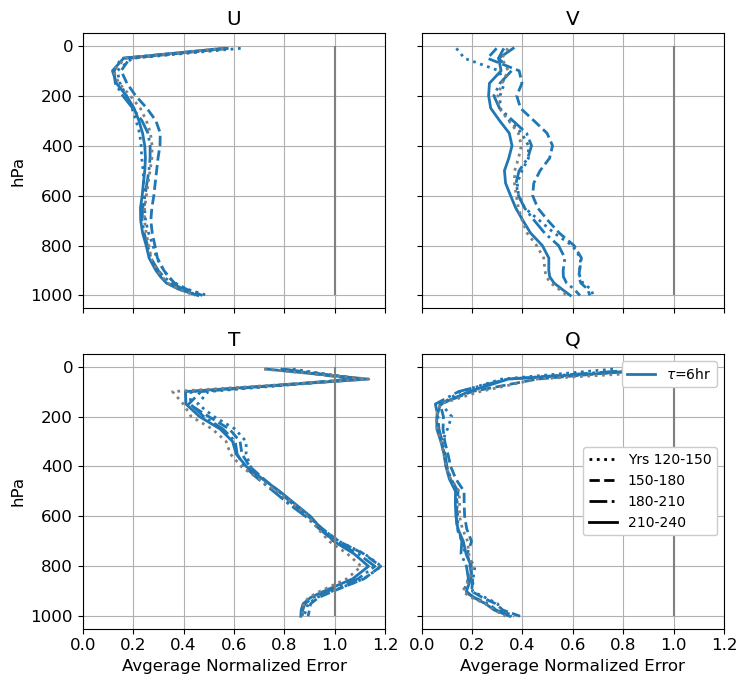

In [114]:
# plot 3 datasets
time_period = 'DJF'; bbox = (0.55,1)
fig, axs = plt.subplots(2, 2, figsize=(7.5, 7), sharey=True, sharex=True)

variables = ['U', 'V', 'T', 'Q']
#colors = ['tab:blue','tab:red','tab:orange','tab:purple']
colors = ['tab:blue','tab:green','tab:purple','tab:red']
linewidths = [2,2,2,2,2,2]
axs = axs.flatten()

iteration_styles = {"Yrs 120-150": ":","150-180": "--","180-210": "-.","210-240":"-"}

for i, var in enumerate(variables):
    ax = axs[i]
    for j, (label, filename) in enumerate(cases.items()):

        try:
            errors_data = xr.open_dataset(file_path+filename+f'/i5_30/{time_period}/{time_period}_norm_error.nc', decode_times=False)
            has_lev = 'lev' in errors_data.dims
            vert_coord = errors_data.lev if has_lev else errors_data.plev
            ax.plot(errors_data[var], vert_coord, linestyle=':', color=colors[j],linewidth=2)
        except:
            print(f'no data iter5 {filename}')

        errors_data = xr.open_dataset(file_path+filename+f'/i6_30/{time_period}/{time_period}_norm_error.nc', decode_times=False)
        has_lev = 'lev' in errors_data.dims
        vert_coord = errors_data.lev if has_lev else errors_data.plev
        ax.plot(errors_data[var], vert_coord, linestyle='--', color=colors[j],linewidth=2)

        try:
            errors_data = xr.open_dataset(file_path+filename+f'/i7_30/{time_period}/{time_period}_norm_error.nc', decode_times=False)
            has_lev = 'lev' in errors_data.dims
            vert_coord = errors_data.lev if has_lev else errors_data.plev
            ax.plot(errors_data[var], vert_coord, linestyle='-.', color=colors[j],linewidth=2)
        except:
            print(f'no data iter7 {filename}')

        errors_data = xr.open_dataset(file_path+filename+f'/i8_30/{time_period}/{time_period}_norm_error.nc', decode_times=False)
        has_lev = 'lev' in errors_data.dims
        vert_coord = errors_data.lev if has_lev else errors_data.plev
        ax.plot(errors_data[var], vert_coord, linestyle='-', color=colors[j],linewidth=2)

        try:
            errors_data = xr.open_dataset(file_path+filename+f'/i9_30/{time_period}/{time_period}_norm_error.nc', decode_times=False)
            has_lev = 'lev' in errors_data.dims
            vert_coord = errors_data.lev if has_lev else errors_data.plev
            ax.plot(errors_data[var], vert_coord, linestyle=':', color='grey',linewidth=2)
        except:
            print(f'no data iter9 {filename}')

    ax.vlines(1, 0, 1000, 'grey','solid')
    ax.set_title(var)
    if i%2==0:
        ax.set_ylabel('hPa')
    if i>1:
        ax.set_xlabel('Avgerage Normalized Error')
    #ax.set_xlim([0,1.75])
    ax.set_xlim([0,1.2])
    ax.grid("true")

axs[1].invert_yaxis()

# One handle for each case/color
case_handles = [Line2D([0], [0],color=colors[j],linestyle="-",linewidth=2,label=case) for j, case in enumerate(cases)]

# One handle for each iteration/linestyle
iteration_handles = [Line2D([0], [0],color="black",linestyle=linestyle,linewidth=2,label=iteration) for iteration, linestyle in iteration_styles.items()]

case_legend = axs[3].legend(handles=case_handles,loc="upper right",fontsize=10,framealpha=1)
axs[3].add_artist(case_legend)
axs[3].legend(handles=iteration_handles,loc="center right",fontsize=10,framealpha=1)

#axs[1].legend(bbox_to_anchor=bbox,fontsize=10,framealpha=1)
plt.tight_layout()
plt.show()
#fig.savefig(fig_dir / f'normerror_{time_period}_tau.png', bbox_inches='tight',dpi=300)

# Figure 5: Tendencies

In [26]:
def plot_horizontal_tendency_matrix(tend_season, case_name, output_path):
    """Constructs a 4x4 matrix mapping model tendencies across pressure coordinates."""

    levels = [250, 500, 850, 975]
    all_var_names = ['UDIFF', 'VDIFF', 'SDIFF', 'QDIFF']
    all_var_labels = ['U', 'V', 'S', 'Q']
    all_labels = ["m/s", "m/s", "J/kg", "g/kg"]

    clevu = np.linspace(-2,2,25)
    clevv = np.linspace(-2,2,25)
    clevq = np.linspace(-7.5e-4,7.5e-4,25)
    clevs = np.linspace(-1000,1000,25)
    all_clevels = [clevu, clevv, clevs, clevq]

    # Dynamically extract dimensions using standard coordinates
    sample_var = tend_season[all_var_names[0]]
    has_lev = 'lev' in sample_var.dims
    vert_dim = 'lev' if has_lev else 'plev'

    # Decide whether to include SDIFF
    sdiff_is_zero = np.all(tend_season['SDIFF'].values == 0)

    if sdiff_is_zero:
        keep_vars = [v for v in all_var_names if v != 'SDIFF']
    else:
        keep_vars = all_var_names

    keep_indices = [all_var_names.index(v) for v in keep_vars]

    var_names = [all_var_names[idx] for idx in keep_indices]
    var_labels = [all_var_labels[idx] for idx in keep_indices]
    clevels = [all_clevels[idx] for idx in keep_indices]
    labels = [all_labels[idx] for idx in keep_indices]

    n_rows = len(levels)
    n_cols = len(var_names)

    plotting_maps = np.empty([n_rows, n_cols, len(tend_season.lat), len(tend_season.lon) + 1])
    for i, lev in enumerate(levels):
        for j, var_name in enumerate(var_names):
            sel_dict = {vert_dim: levels[i]}
            data_slice = corrtools.weighted_monthly_mean(tend_season[var_names[j]]).sel(method='nearest', **sel_dict)
            plotting_maps[i, j, :, :], plot_lons = add_cyclic_point(data_slice, coord=tend_season.lon)

    fig, axs = plt.subplots(n_rows, n_cols, figsize=(10, 7), subplot_kw={'projection': ccrs.PlateCarree(central_longitude=180)}, sharex=True, sharey=True)
    xticks = np.arange(-180, 181, 90)
    yticks = np.arange(-60, 61, 60)
    axes_obj = []

    for i in range(n_rows):
        for j in range(n_cols):
            cmap = cmap_white_center(clevels[j],'RdYlBu_r')
            pl = axs[i,j].contourf(plot_lons, tend_season.lat, plotting_maps[i,j,:,:], levels=clevels[j], 
                                   cmap=cmap, extend='both', transform=ccrs.PlateCarree())
            if i == 0:
                axs[i,j].set_title(f'{var_labels[j]}', fontsize=12)
                axes_obj.append(pl)
            if j == 0:
                axs[i, j].set_ylabel(str(levels[i])+' hPa', fontsize=12)

            axs[i, j].coastlines()
            axs[i, j].set_xticks(xticks, crs=ccrs.PlateCarree())
            axs[i, j].xaxis.set_major_formatter(cticker.LongitudeFormatter())
            axs[i, j].set_yticks(yticks, crs=ccrs.PlateCarree())
            axs[i, j].yaxis.set_major_formatter(cticker.LatitudeFormatter())
    
            axs[i, j].tick_params(axis="x",which="both",bottom=True,top=False,labelbottom=(i == n_rows - 1),labelsize=10)
            axs[i, j].tick_params(axis="y",which="both",left=True,right=False,labelleft=(j == 0),labelsize=10)

    fig.subplots_adjust(hspace=0.1, wspace=0.1)

    for idx in range(n_cols):
        ax_pos = axs[-1, idx].get_position()
        cb_ax = fig.add_axes([ax_pos.x0,ax_pos.y0-.07,ax_pos.width,0.017])
        cb = fig.colorbar(axes_obj[idx],cax=cb_ax,orientation="horizontal")
        ticks = cb.get_ticks()
        cb.set_ticks(ticks[::2])
        if var_names[idx] == "QDIFF":
            cb.ax.xaxis.set_major_formatter(FuncFormatter(lambda x, pos: f"{x * 1000:g}"))
        cb.set_label(labels[idx])
        cb.ax.tick_params(labelsize=10)#, rotation=45)

    #fig.suptitle(f'{case_name} Tendencies', y=0.92, fontsize=14)
    fig.savefig(output_path, bbox_inches='tight', dpi=300)
    #plt.close(fig)

In [27]:
tendency_case = 'nudge30_coef_1_i9'; case_name = 'Climo nudge UVQ'
tendency_dir = f'/n/home04/sweidman/holylfs06/IC_CESM2/monave/{tendency_case}'

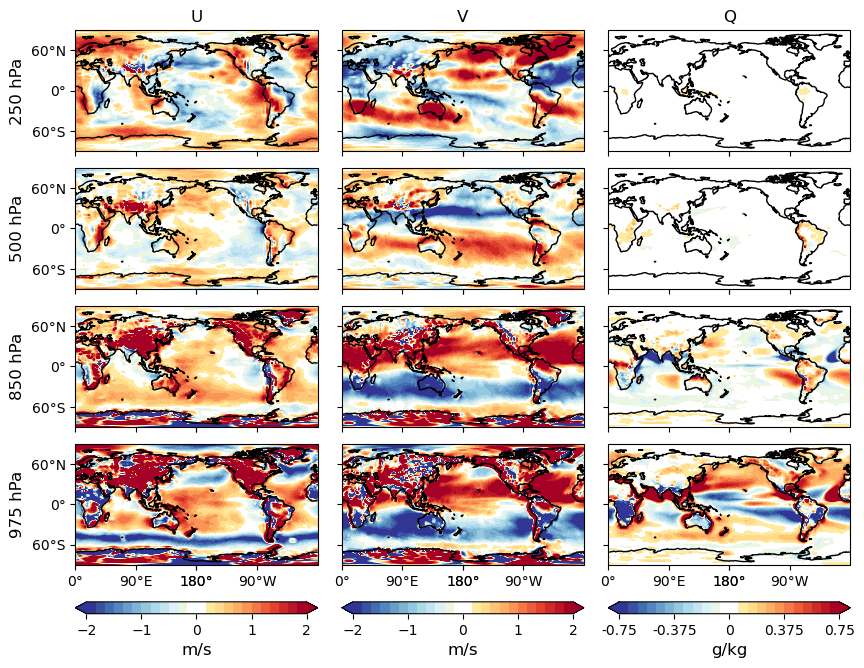

In [28]:
MONTHS = [12,1,2]; TIME_LABEL='DJF'
climo_PS_file = corrtools.open_monthly_merra('/n/home04/sweidman/holylfs06/MERRA2_OG/MERRA2_f19/',mons=MONTHS)['PS']
tendency_dataset = corrtools.open_monthly_tendencies(tendency_dir, MONTHS, regrid=False)
tendency_dataset['PS'] = climo_PS_file
tends_plev = corrtools.regrid_plev(tendency_dataset)
tends_plev['SDIFF'] = 0.
plot_horizontal_tendency_matrix(tends_plev, case_name, fig_dir / f'{TIME_LABEL}_hori_tends.png')

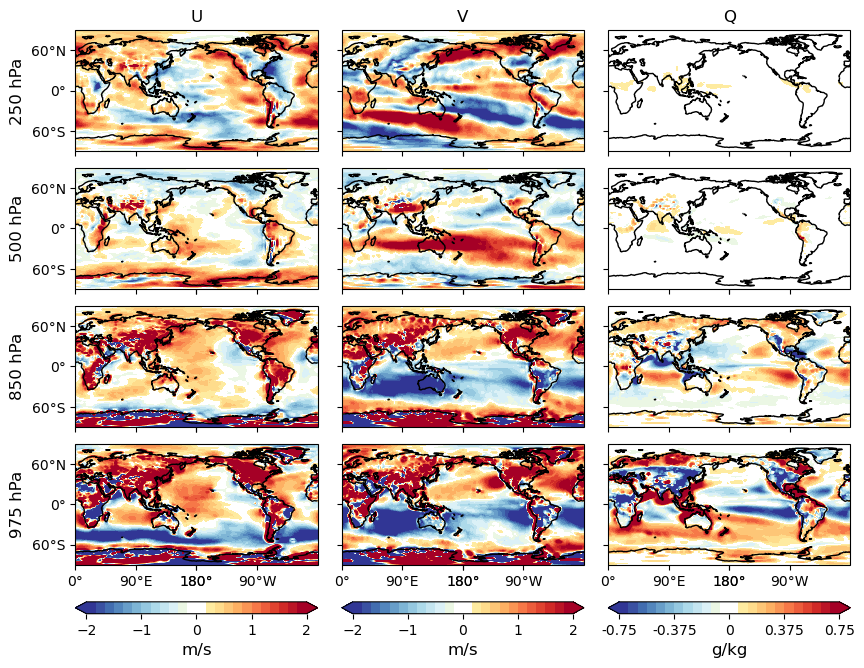

In [29]:
MONTHS = [6,7,8]; TIME_LABEL='JJA'
climo_PS_file = corrtools.open_monthly_merra('/n/home04/sweidman/holylfs06/MERRA2_OG/MERRA2_f19/',mons=MONTHS)['PS']
tendency_dataset = corrtools.open_monthly_tendencies(tendency_dir, MONTHS, regrid=False)
tendency_dataset['PS'] = climo_PS_file
tends_plev = corrtools.regrid_plev(tendency_dataset)
tends_plev['SDIFF'] = 0.
plot_horizontal_tendency_matrix(tends_plev, case_name, fig_dir / f'{TIME_LABEL}_hori_tends.png')

# Figure 6: Tendency pattern correlation

In [70]:
def eof_xr(da, sample_dim="iteration", center=False):

    if center:
        reference_mean = da.mean(sample_dim)
        anom = da - reference_mean
    else:
        reference_mean = xr.zeros_like(da.isel({sample_dim: 0}))
        anom = da.copy()

    coslat = np.cos(np.deg2rad(da.coords['lat'].values))
    wgts = np.sqrt(coslat).clip(min=0)[..., np.newaxis]

    anom = anom.rename({sample_dim: 'time'})
    solver = Eof(anom, weights=wgts,center=False)
    eof1 = solver.eofs(neofs=1, eofscaling=0).isel(mode=0)
    pc1 = solver.pcs(npcs=1, pcscaling=0).isel(mode=0)
    var_exp = solver.varianceFraction(neigs=1).isel(mode=0)

    if pc1.isel({'time': -1}) < 0:
        eof1 = -eof1
        pc1 = -pc1

    return solver, xr.Dataset({
        "EOF1": eof1,
        "PC1": pc1,
        "reference_mean": reference_mean,
        "variance_fraction": xr.DataArray(var_exp)
    })

In [71]:
def project_pcs(da, solver, reference_mean, sample_dim='iteration'):

    anom = da - reference_mean
    anom = anom.rename({sample_dim: 'time'})
    
    pseudo_pcs = solver.projectField(anom,neofs=1,eofscaling=0,weighted=True)

    if pseudo_pcs.isel({'time': -1}) < 0:
        pseudo_pcs = -pseudo_pcs

    return pseudo_pcs.isel(mode=0)

In [72]:
def stack_monthly_tendencies(case, levsel=15, varsel='UDIFF', iterations=np.arange(5,11),
                             mons=[12,1,2], base_path='/n/home04/sweidman/holylfs06/IC_CESM2/monave'):

    iter_data = []

    for i in iterations:
        ds = corrtools.open_monthly_tendencies(f'{base_path}/{case}_i{i}', mons, regrid=False).sel(lev=levsel, method='nearest')[varsel]
        ds = corrtools.weighted_monthly_mean(ds) 
        iter_data.append(ds)

    return xr.concat(iter_data, dim=pd.Index(iterations, name='iteration'))

In [86]:
def plot_eof_convergence(eof_results, case_pcs, variables, output_path):

    colors = ['tab:purple','tab:red','tab:green','tab:blue', 'black']
    var_names = ['U','V','Q']; units = ['m/s','m/s','g/kg']

    fig = plt.figure(figsize=(11, 9))
    gs = fig.add_gridspec(3, 2, width_ratios=[1.3, 1], wspace=0.25, hspace=0.2)
    axes = np.empty((3, 2), dtype=object)
    
    for i in range(3):
        axes[i, 0] = fig.add_subplot(gs[i, 0], projection=ccrs.PlateCarree(central_longitude=180))
        axes[i, 1] = fig.add_subplot(gs[i, 1])
    xticks, yticks = np.arange(-180, 181, 60), np.arange(-60, 61, 30)
    levels = np.linspace(-0.04, 0.04, 25)
    years = [30 * i for i in case_pcs["QDIFF"].time.values]
    
    for i, var in enumerate(variables):
        eof_result = eof_results[var]
        cf = axes[i, 0].contourf(eof_result.lon, eof_result.lat, eof_result.EOF1, transform=ccrs.PlateCarree(),
                            levels=levels, cmap=cmap_white_center(levels,"RdYlBu_r"), extend="both")
        fig.colorbar(cf, ax=axes[i, 0], orientation="vertical", pad=0.02, shrink=0.8)
        axes[i, 0].coastlines()
        axes[i, 0].set_title(f"{var_names[i]} EOF1: {np.round(eof_result.variance_fraction.values*100,1)}%")
        axes[i, 0].set_xticks(xticks, crs=ccrs.PlateCarree())
        axes[i, 0].set_yticks(yticks, crs=ccrs.PlateCarree())
        axes[i, 0].xaxis.set_major_formatter(cticker.LongitudeFormatter())
        axes[i, 0].yaxis.set_major_formatter(cticker.LatitudeFormatter())
    
        for j, case in enumerate(case_pcs[var].case.values):
            pc = case_pcs[var].sel(case=case)
            if var != 'QDIFF':
                axes[i, 1].plot(years, pc, label=str(case), linewidth=2, color = colors[j])
            else:
                axes[i, 1].plot(years, pc*1000, label=str(case), linewidth=2, color = colors[j])
            axes[i, 1].set_ylabel(units[i], fontsize=12)
            mask = ~np.isnan(pc)
            regress = linregress(case_pcs[var].time[mask], pc[mask])
            #print(var, case, regress.slope)

    # Panel labels
    axes[0, 0].text(0.02, 1.13, "(a)",transform=axes[0, 0].transAxes,ha="left", va="top",fontsize=14, fontweight="bold")
    axes[0, 1].text(0.02, 1.11, "(b)",transform=axes[0, 1].transAxes,ha="left", va="top",fontsize=14, fontweight="bold")
    
    axes[0, 1].set_title(f"PC1 amplitude")
    axes[i, 1].set_xlabel("Convergence length [years]")
    axes[0, 1].legend(bbox_to_anchor=(1.02, 1))
    fig.savefig(output_path, bbox_inches='tight', dpi=300)

In [74]:
levsel = 800
varsel = ['UDIFF','VDIFF','QDIFF']
sample_dim = 'iteration'
MONTHS=[12,1,2]; TIME_LABEL='DJF'
#MONTHS=[6,7,8]; TIME_LABEL='JJA'

nudge_timeseries_coef_6 = stack_monthly_tendencies('nudge30_coef_1', levsel, varsel, iterations=range(5,11), mons=MONTHS)
nudge_timeseries_coef_12 = stack_monthly_tendencies('nudge30_coef_0.5', levsel, varsel, iterations=range(5,10), mons=MONTHS)
nudge_timeseries_coef_24 = stack_monthly_tendencies('nudge30_uvq', levsel, varsel, iterations=range(5,11), mons=MONTHS)
nudge_timeseries_coef_48 = stack_monthly_tendencies('nudge30_coef_0.12', levsel, varsel, iterations=range(5,9), mons=MONTHS)
nudge_timeseries_noint = stack_monthly_tendencies('nudge30_integrate_false', levsel, varsel, iterations=range(5,9), mons=MONTHS)

In [75]:
solvers = {}
eof_results = {}
for var in varsel:
    solvers[var], eof_results[var] = eof_xr(nudge_timeseries_coef_6[var],sample_dim)

cases = {"6hr": nudge_timeseries_coef_6,
         "12hr": nudge_timeseries_coef_12,
         "24hr": nudge_timeseries_coef_24,
         "48hr": nudge_timeseries_coef_48,
         "CABCOR\n(24hr)": nudge_timeseries_noint}

case_pcs = {var: xr.concat([project_pcs(da[var], solvers[var], eof_results[var].reference_mean, sample_dim) for da in cases.values()],
                           dim=xr.IndexVariable("case", list(cases))) for var in varsel}

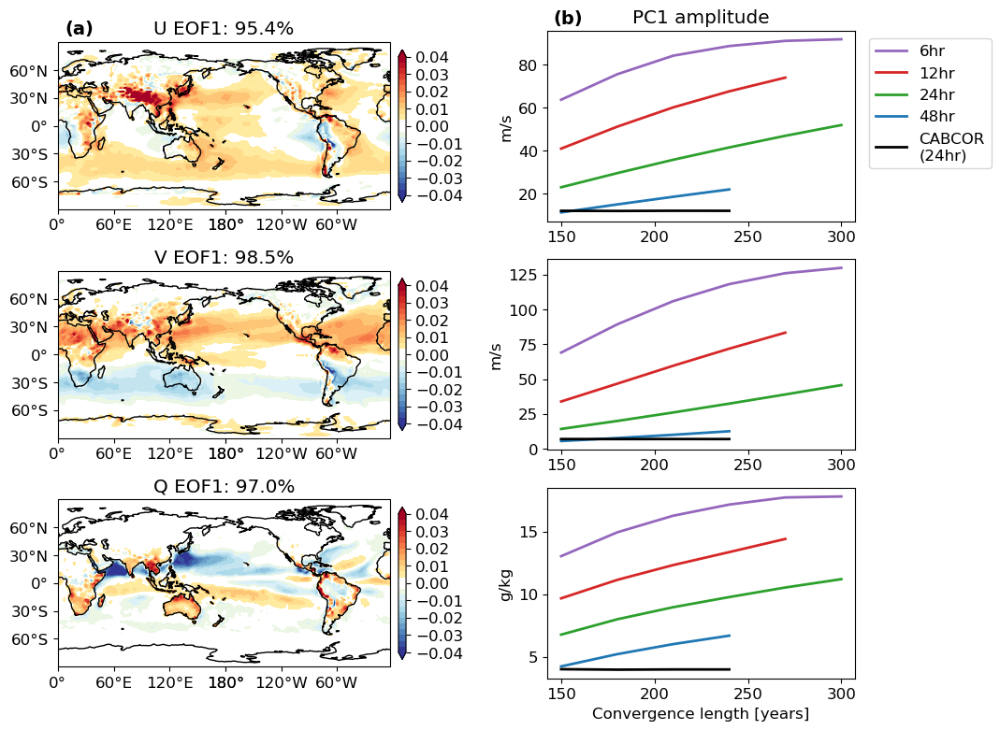

In [87]:
plot_eof_convergence(eof_results, case_pcs, varsel, output_path = fig_dir / f'{TIME_LABEL}_tend_eofs.png')

In [316]:
MONTHS=[12,1,2]; TIME_LABEL='DJF'
#MONTHS=[6,7,8]; TIME_LABEL='JJA'
tend_compare = 'nudge30_coef_1_i7'

list_cases = ['nudge30_uvq', 'nudge30_coef_0.5','nudge30_coef_1','nudge30_integrate_false']
case_names = [r"$\tau$=24hr",r"$\tau$=12hr",r"$\tau$=6hr",'CABCOR\n(24hr)']
iterations = np.arange(5,10)

varlist = ['UDIFF','VDIFF','QDIFF']
var_names = ['U','V','Q']
lf_map = xr.open_dataset('/n/holystore01/INTERNAL_REPOS/CLIMATE_MODELS/cesm_2_1/inputdata/atm/cam/topo/USGS-gtopo30_1.9x2.5_remap_c050602.nc')['LANDFRAC']
lf_scale = 0.5
lat = lf_map.lat
ds_compare = corrtools.open_monthly_tendencies(f'/n/home04/sweidman/holylfs06/IC_CESM2/monave/{tend_compare}', MONTHS, regrid=False)

records = []
for case, name in zip(list_cases, case_names):
    case_record = []
    for itern in iterations:
        tend_dir = f'/n/home04/sweidman/holylfs06/IC_CESM2/monave/{case}_i{itern}'
        try:
            ds = corrtools.open_monthly_tendencies(tend_dir, MONTHS, regrid=False)
            ds1_m = corrtools.apply_regional_mask(ds_compare, 'global', lat, lf_map, lf_scale)
            ds_m = corrtools.apply_regional_mask(ds, 'global', lat, lf_map, lf_scale)
            pattern_corrs = corrtools.compute_pattern_correlation(ds1_m, ds_m, varlist)
            case_record.append({'iteration': itern, 'pattern_corrs': pattern_corrs})
        except FileNotFoundError:
            continue

    records.append({'name': name, 'pattern_corrs': case_record}) 

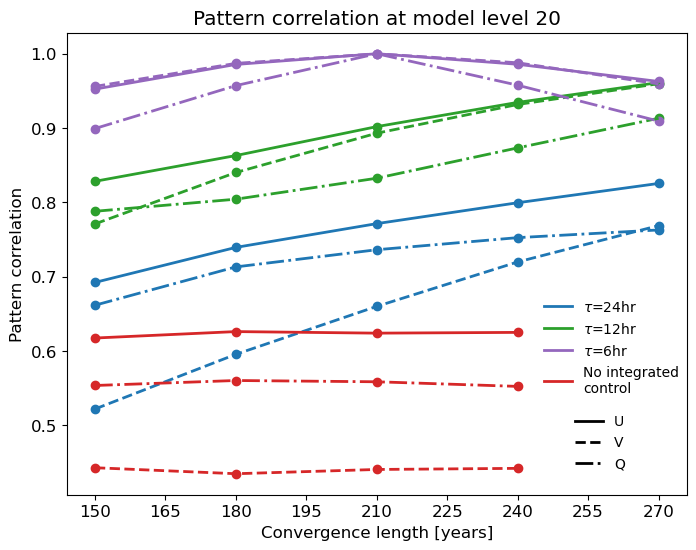

In [317]:
case_colors = ['tab:blue','tab:green','tab:purple','tab:red']

levsel = 600
linestyles = ['-', '--', '-.', ':']

fig, ax = plt.subplots(figsize=(8, 6))

for i, record in enumerate(records):
    color = case_colors[i]
    # sort by iteration just in case
    entries = sorted(record['pattern_corrs'], key=lambda e: e['iteration'])
    years = [30 * e['iteration'] for e in entries]

    for j, var in enumerate(varlist):
        vals = []
        for e in entries:
            da = e['pattern_corrs'][var]
            val = da.sel(lev=levsel, method='nearest').values.item()
            vals.append(val)

        ax.plot(years, vals, color=color, linestyle=linestyles[j % len(linestyles)], linewidth=2)
        ax.scatter(years, vals, color=color, marker='o')


ax.set_xlabel('Convergence length [years]')
ax.set_ylabel('Pattern correlation')
ax.set_title(f'Pattern correlation at model level 20')
ax.xaxis.set_major_locator(MaxNLocator(integer=True))

# Build two separate legends
case_handles = [Line2D([0], [0], color=case_colors[i], lw=2, label=record['name'])
                 for i, record in enumerate(records)]
var_handles = [Line2D([0], [0], color='black', linestyle=linestyles[j % len(linestyles)], lw=2, label=var_names[j])
               for j in range(len(varlist))]

case_legend = ax.legend(handles=case_handles, bbox_to_anchor=(.75, .45), fontsize=10,frameon=False)
ax.add_artist(case_legend)  # keep this legend when adding the second one
ax.legend(handles=var_handles, bbox_to_anchor=(.8, 0.2), fontsize=10, frameon=False)

fig.savefig(fig_dir / f'{TIME_LABEL}_pattern_corr_iter.png', bbox_inches='tight', dpi=300)

In [92]:
#MONTHS=[12,1,2]; TIME_LABEL='DJF'
MONTHS=[6,7,8]; TIME_LABEL='JJA'
tend_compare = 'nudge30_coef_1_i6'; name_compare = r'$\tau$=6hr (150 yrs)'
tend_cases = ['nudge_control_norun_uvq','nudge30_coef_0.5_i7','nudge30_uvq_i9']
case_names = ['Instantaneous nudge',r'$\tau$=12hr (210 yrs)',r'$\tau$=24hr (270 yrs)']

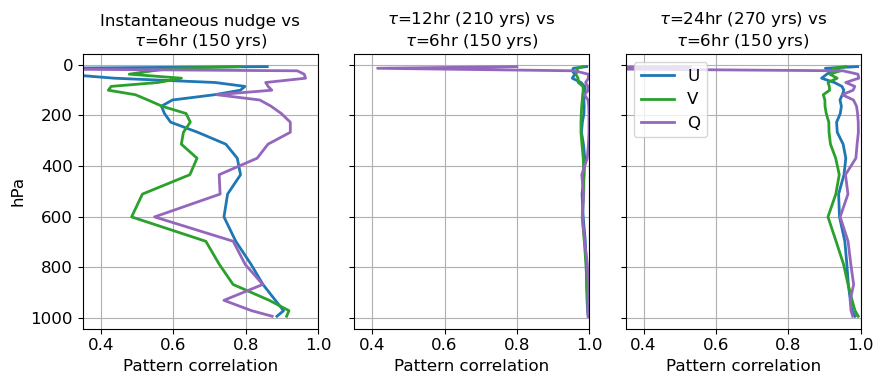

In [93]:
lf_map = xr.open_dataset('/n/holystore01/INTERNAL_REPOS/CLIMATE_MODELS/cesm_2_1/inputdata/atm/cam/topo/USGS-gtopo30_1.9x2.5_remap_c050602.nc')['LANDFRAC']
lf_scale = 0.5
lat = lf_map.lat
varlist = ['UDIFF','VDIFF','QDIFF']
var_names = ['U','V','Q']
colors = ['tab:blue','tab:green','tab:purple']

ds_compare = corrtools.open_monthly_tendencies(f'/n/home04/sweidman/holylfs06/IC_CESM2/monave/{tend_compare}', MONTHS, regrid=False)

records = []
for case, name in zip(tend_cases, case_names):
    tend_dir = f'/n/home04/sweidman/holylfs06/IC_CESM2/monave/{case}'
    ds = corrtools.open_monthly_tendencies(tend_dir, MONTHS, regrid=False)
    ds1_m = corrtools.apply_regional_mask(ds_compare, 'global', lat, lf_map, lf_scale)
    ds_m = corrtools.apply_regional_mask(ds, 'global', lat, lf_map, lf_scale)
    pattern_corrs = corrtools.compute_pattern_correlation(ds1_m, ds_m, varlist)
    records.append({'case_name': name, 'pattern_corrs': pattern_corrs})

fig, axes = plt.subplots(1, len(tend_cases), figsize=(9, 4), sharex=True, sharey=True)
for row, record in enumerate(records):
    for j, var in enumerate(varlist):
        corr = record['pattern_corrs'][var]
        axes[row].plot(corr, corr.lev, label=var_names[j], color=colors[j], linewidth=2)
    axes[row].set(xlim=(.35, 1))
    axes[row].set_title(f"{record['case_name']} vs\n{name_compare}", fontsize=12)
    axes[row].grid(True)
    axes[row].set_xlabel('Pattern correlation')

fig.subplots_adjust(wspace=0.05)
    
axes[0].set_ylabel('hPa')
axes[0].invert_yaxis()
axes[-1].legend(loc='upper left')
plt.tight_layout()
fig.savefig(fig_dir / f'{TIME_LABEL}_pattern_corr.png', bbox_inches='tight', dpi=300)

# Figure 8: Precipitation

In [ ]:
def open_precip_files(case1_dir, case2_dir, years, months, climo_set):

    # open and convert model data
    case1 = corrtools.open_monthly_model(case1_dir,years,var_list=['PRECT'],regrid=False, mons=months)
    case2 = corrtools.open_monthly_model(case2_dir,years,var_list=['PRECT'],regrid=False, mons=months)
    
    case1 = corrtools.convert_ms_to_mmday(case1)
    case2 = corrtools.convert_ms_to_mmday(case2)

    # open and convert GPCP
    gpcp_pr = xr.open_dataset('~/holylfs06/ncep-ncar/gpcp/precip.mon.mean.nc', decode_times=False)['precip']
    dates = cftime.num2date(gpcp_pr["time"].values,units=gpcp_pr["time"].attrs["units"],
                            calendar=gpcp_pr["time"].attrs.get("calendar", "standard"))
    gpcp_pr = gpcp_pr.assign_coords(time=("time", dates)).sel(time=slice('1980-01','2009-12'))
    gpcp_pr_monave = gpcp_pr.groupby('time.month').mean(dim='time')
    gpcp_pr_season = gpcp_pr_monave.sel(month=months)
    gpcp_pr_season_interp = gpcp_pr_season.interp(lat=case1.lat, lon=case1.lon, method='nearest')

    # open and convert NCEP
    ncep_pr = xr.open_dataset('~/holylfs06/ncep-ncar/prate/prate.day.mean.nc')['prate']
    ncep_pr_season = ncep_pr.groupby('time.month').mean(dim='time').sel(month=months).sortby('lat')
    ncep_pr_season = ncep_pr_season * 86400.0 # kg/m2/s to mm/day
    ncep_pr_season_interp = ncep_pr_season.interp(lat=case1.lat, lon=case1.lon, method='nearest')

    # open and convert MERRA precip
    merra_ts, merra_flx, merra_omega = corrtools.open_monthly_merra_sfc('/n/home04/sweidman/holylfs06/MERRA2_OG/MERRA2_f19/',mons=MONTHS, climo_set=climo_set)
    merra_flx_rolled = (merra_flx.assign_coords(lon=(merra_flx.lon % 360)).sortby("lon"))
    merra_flx_interp = merra_flx_rolled.interp(lat=case1.lat, lon=case1.lon, method='nearest')
    merra_flx_interp['PRECT'] = merra_flx_interp['PRECTOTCORR']*86400.0

    return case1['PRECT'], case2['PRECT'], gpcp_pr_season_interp, ncep_pr_season_interp, merra_flx_interp['PRECT']

In [56]:
def pr_pattern_corr(ds1, ds2, region='global'):

    lf_map = xr.open_dataset('/n/holystore01/INTERNAL_REPOS/CLIMATE_MODELS/cesm_2_1/inputdata/atm/cam/topo/USGS-gtopo30_1.9x2.5_remap_c050602.nc')['LANDFRAC']
    lf_scale = 0.5
    lat = lf_map.lat
    
    ds1_m = corrtools.apply_regional_mask(ds1, region, lat, lf_map, lf_scale)
    ds2_m = corrtools.apply_regional_mask(ds2, region, lat, lf_map, lf_scale)

    a_sel = corrtools.weighted_monthly_mean(ds1_m)
    b_sel = corrtools.weighted_monthly_mean(ds2_m)
            
    WGT = np.cos(a_sel.lat*np.pi/180)
    xyCov    = np.sum(WGT*a_sel*b_sel)
    xAnom2   = np.sum(WGT*a_sel**2)
    yAnom2   = np.sum(WGT*b_sel**2)

    pat_corr = xyCov/(np.sqrt(xAnom2)*np.sqrt(yAnom2))

    return pat_corr

In [59]:
def plot_lat_vs_lon_bias_pr(models, observations, model_names, obs_names, output_path):
    # Inputs: observations should already be interpolated to the model grid
    
    # Calculate means and biases
    model_means = [corrtools.weighted_monthly_mean(x) for x in models]
    obs_means = [corrtools.weighted_monthly_mean(x) for x in observations]
    bias_means = [[model - obs for obs in obs_means] for model in model_means]

    bias_rmses = [[corrtools.compute_weighted_rmse_season(model, obs) for obs in observations] for model in models]
    pattern_corrs = [[pr_pattern_corr(model, obs, 'global') for obs in observations] for model in models]
    pattern_corrs_trop = [[pr_pattern_corr(model, obs, 'tropics') for obs in observations] for model in models]
    print('tropical pattern correlation: ',pattern_corrs_trop)

    lat_weights = np.cos(np.deg2rad(model_means[0].lat))
    model_pravg = [x.weighted(lat_weights).mean(['lat','lon'], skipna=True) for x in model_means]
    
    bias_pravg = [[corrtools.weighted_monthly_mean(model - obs).weighted(lat_weights).mean(['lat','lon'], skipna=True) for obs in observations] for model in models]
    
    # Add cyclic longitude points
    model_maps = []
    bias_maps = [[], []]
    for row, model in enumerate(model_means):
        model_cyclic, plot_lons = add_cyclic_point(model, model.lon)
        model_maps.append(model_cyclic)
        bias_maps[row] = [add_cyclic_point(bias) for bias in bias_means[row]]
    obs_maps = [add_cyclic_point(obs.values) for obs in obs_means]
    
    plot_lats = model_means[0].lat.values
    data_crs = ccrs.PlateCarree()
    projection = ccrs.PlateCarree(central_longitude=180)

    nrows = len(models)
    ncols = len(observations)+1
    
    fig, axs = plt.subplots(nrows, ncols, figsize=(10, 6), subplot_kw={"projection": projection})
    
    precip_levels = np.linspace(0, 18, 19)
    bias_levels = np.arange(-5, 5.2, 0.2)
    bias_cmap = cmap_white_center(bias_levels, "BrBG")
    xticks, yticks = np.arange(-180, 181, 60), np.arange(-60, 61, 30)
    
    for row, model_name in enumerate(model_names):
        precip_plot = axs[row, 0].contourf(plot_lons, plot_lats, model_maps[row], levels=precip_levels, 
                                           cmap="Blues", extend="max", transform=data_crs)
        axs[row, 0].set_ylabel(model_name, fontsize=13)
        axs[row, 0].text(0.07, 1.05,str(np.round(model_pravg[row].item(),2))+' mm/day',transform=axs[row, 0].transAxes,ha="center",va="center")

    
        for obs_index in range(len(observations)):
            col = obs_index + 1
            bias_plot = axs[row, col].contourf(plot_lons, plot_lats, bias_maps[row][obs_index], 
                                               levels=bias_levels, cmap=bias_cmap, extend="both", transform=data_crs)
            axs[row, 0].contour(plot_lons, plot_lats, obs_maps[obs_index], levels=precip_levels[::2], 
                                  colors="dimgrey", linewidths=1,transform=data_crs)

            axs[row, col].text(0.07, 1.05,str(np.round(bias_pravg[row][obs_index].item(), 2))+' mm/day',transform=axs[row, col].transAxes,ha="center",va="center")
            axs[row, col].text(.95, 1.05,np.round(pattern_corrs[row][obs_index].item(), 2),transform=axs[row, col].transAxes,ha="center",va="center")

    
    axs[0, 0].set_title("Precipitation rate", fontsize=14)
    for bias_col in range(1,ncols):
        axs[0, bias_col].set_title(f"Model − {obs_names[bias_col-1]}", fontsize=14)
    
    for row in range(nrows):
        for col in range(ncols):
            ax = axs[row, col]
            ax.coastlines()
            ax.set_xticks(xticks, crs=data_crs)
            ax.set_yticks(yticks, crs=data_crs)
            ax.xaxis.set_major_formatter(cticker.LongitudeFormatter())
            ax.yaxis.set_major_formatter(cticker.LatitudeFormatter())
            ax.tick_params(labelsize=10, labelleft=(col == 0), labelbottom=(row == 1))

    fig.subplots_adjust(left=0.09, right=0.98, top=0.91, bottom=0.18, wspace=0.06, hspace=0.12)

    precip_pos = axs[-1, 0].get_position()
    bias_pos = axs[-1, 1].get_position()
    precip_cbar_ax = fig.add_axes([precip_pos.x0, 0.08, precip_pos.width, 0.025])
    bias_cbar_ax = fig.add_axes([bias_pos.x0, .08, bias_pos.width, 0.025])
    
    #precip_cbar_ax = fig.add_axes([0.10, 0.08, 0.37, 0.025])
    precip_cbar = fig.colorbar(precip_plot, cax=precip_cbar_ax, orientation="horizontal")
    precip_cbar.set_label("[mm/day]")
    precip_cbar.ax.tick_params(labelsize=10)
    
    #bias_cbar_ax = fig.add_axes([0.55, 0.08, 0.37, 0.025])
    bias_cbar = fig.colorbar(bias_plot, cax=bias_cbar_ax, orientation="horizontal")
    bias_cbar.set_label("[mm/day]")
    bias_cbar.ax.tick_params(labelsize=10)
    
    # fig.suptitle(f"Precipitation comparison: {time_name}", fontsize=15)
    fig.savefig(output_path, bbox_inches="tight", dpi=300)
    plt.show()

In [61]:
control_case = 'cam_control'
corrected_case = 'apply_nudge30_coef_1'; iteration='iter9'
case_names = ['Control','Corrected']
analysis_years = np.arange(1980,2010)

In [62]:
control_dir = f'/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/{control_case}/atm/hist/{control_case}'
corrected_dir = f'/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/{corrected_case}/atm/hist/{iteration}/{corrected_case}'

In [63]:
MONTHS=[12,1,2]; TIME_LABEL='DJF'
control_pr, model_pr, gpcp_pr, ncep_pr, merra_pr = open_precip_files(control_dir, corrected_dir, analysis_years, MONTHS, climo_set='monave30')
models = [control_pr, model_pr]
observations = [merra_pr]; obs_names = ['MERRA']

/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/cam_control/atm/hist/cam_control
/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/apply_nudge30_coef_1/atm/hist/iter9/apply_nudge30_coef_1


tropical pattern correlation:  [[<xarray.DataArray ()> Size: 8B
array(0.897641)], [<xarray.DataArray ()> Size: 8B
array(0.96724941)]]


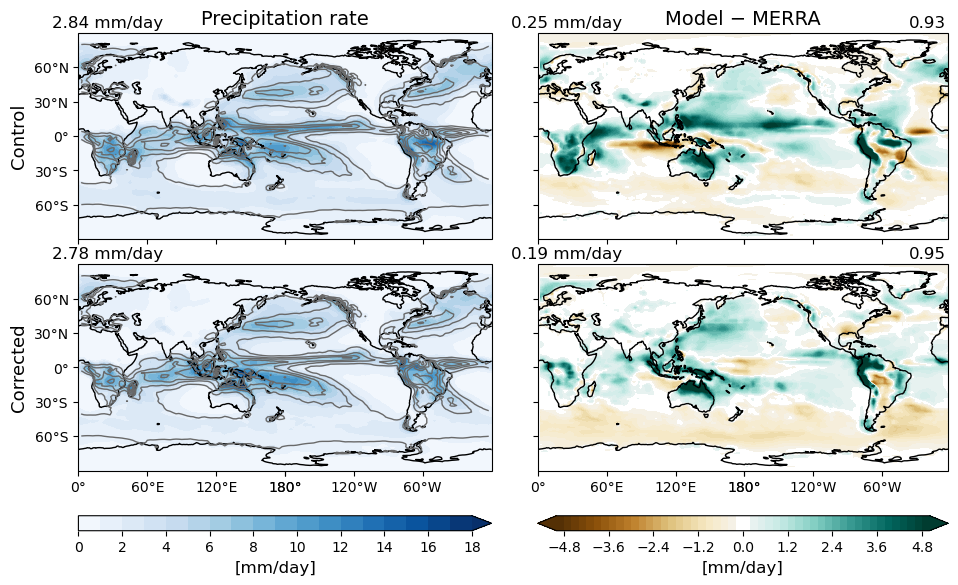

In [64]:
plot_lat_vs_lon_bias_pr(models, observations, case_names, obs_names, fig_dir / f'{TIME_LABEL}_pr_merra.png')

In [65]:
MONTHS=[6,7,8]; TIME_LABEL='JJA'
control_pr, model_pr, gpcp_pr, ncep_pr, merra_pr = open_precip_files(control_dir, corrected_dir, analysis_years,MONTHS, climo_set='monave30')
models = [control_pr, model_pr]
observations = [merra_pr]; obs_names = ['MERRA']

/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/cam_control/atm/hist/cam_control
/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/apply_nudge30_coef_1/atm/hist/iter9/apply_nudge30_coef_1


tropical pattern correlation:  [[<xarray.DataArray ()> Size: 8B
array(0.94101971)], [<xarray.DataArray ()> Size: 8B
array(0.96777683)]]


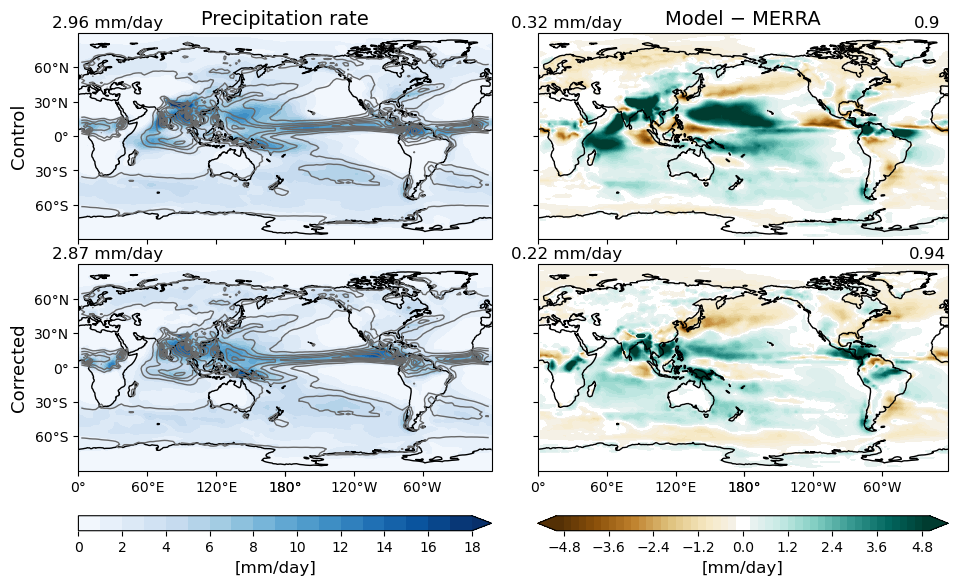

In [66]:
plot_lat_vs_lon_bias_pr(models, observations, case_names, obs_names, fig_dir / f'{TIME_LABEL}_pr_merra.png')

# Figure 10: Transients

In [134]:
def plot_transient_eddies_and_bias(ds_transients, ds_obs, ds_control, case_name, output_path):
    
    """Plot variables by row and corrected/bias fields by column."""
    modl_vars = ["EKE", "VpQp", "VpTp"]
    var_names = ["EKE", "V'Q'", "V'T'"]
    var_labels = [r'$\mathrm{m^2\,s^{-2}}$',r'$\mathrm{m\,s^{-1}\,g\,kg^{-1}}$', r'$\mathrm{K\,m\,s^{-1}}$']

    vert_dim = 'lev' if 'lev' in ds_transients.dims else 'plev'
    projection, data_crs = ccrs.PlateCarree(central_longitude=180), ccrs.PlateCarree()
    fig, ax = plt.subplots(len(modl_vars), 3, figsize=(10, 5), subplot_kw={"projection": projection})
    
    # fig = plt.figure(figsize=(9, 7))
    # gs = fig.add_gridspec(5, 3, height_ratios=[1, 1, 1, 0.35, 1], hspace=0.08, wspace=0.08)
    # ax = np.empty((4, 3), dtype=object)
    # for row in range(3):
    #     for col in range(3):
    #         ax[row, col] = fig.add_subplot(gs[row, col], projection=projection)
    
    # for col in range(3):
    #     ax[3, col] = fig.add_subplot(gs[4, col], projection=projection)

    xticks = np.arange(-180, 181, 120)
    yticks = np.arange(-60, 61, 60)
    
    model_mean = corrtools.weighted_monthly_mean(ds_transients)
    obs_mean = corrtools.weighted_monthly_mean(ds_obs)
    control_mean = corrtools.weighted_monthly_mean(ds_control)

    for nummy, Vary in enumerate(modl_vars):
        levdo = 850 if (Vary == 'VpQp' or Vary == 'VpTp') else 200
        model_sel = {vert_dim: levdo}
        plotter_scaling = 1000 if Vary == 'VpQp' else 1

        if Vary == 'VpQp':
            raw_levels, bias_levels, cmap_base = np.linspace(-12, 12, 25), np.linspace(-6, 6, 25), "BrBG"
        elif Vary == 'VpTp':
            raw_levels, bias_levels, cmap_base = np.linspace(-30, 30, 25), np.linspace(-15, 15, 25), "RdYlBu_r"
        else:
            raw_levels, bias_levels, cmap_base = np.linspace(-300, 300, 25), np.linspace(-150, 150, 25), "RdYlBu_r"

        mod_slice = model_mean.sel(method='nearest', **model_sel)[Vary]
        obs_slice = obs_mean.sel(method='nearest', **model_sel)[Vary]
        control_slice = control_mean.sel(method='nearest', **model_sel)[Vary]
        raw_data = mod_slice.squeeze() * plotter_scaling
        bias_data = (mod_slice - obs_slice).squeeze() * plotter_scaling
        control_diff = (mod_slice - control_slice).squeeze() * plotter_scaling
        #control_diff = (control_slice - obs_slice).squeeze() * plotter_scaling

        raw_cyclic, raw_lons = add_cyclic_point(raw_data, coord=raw_data.lon)
        bias_cyclic, bias_lons = add_cyclic_point(bias_data, coord=bias_data.lon)
        control_cyclic, control_lons = add_cyclic_point(control_diff, coord=control_diff.lon)

        raw_im = ax[nummy, 0].contourf(raw_lons, raw_data.lat, raw_cyclic, levels=raw_levels,
                                      cmap=cmap_white_center(raw_levels, cmap_base), extend='both', transform=data_crs)
        bias_im = ax[nummy, 1].contourf(bias_lons, bias_data.lat, bias_cyclic, levels=bias_levels,
                                       cmap=cmap_white_center(bias_levels, cmap_base), extend='both', transform=data_crs)
        control_im = ax[nummy, 2].contourf(control_lons, control_diff.lat, control_cyclic, levels=bias_levels,
                                          cmap=cmap_white_center(bias_levels, cmap_base), extend='both', transform=data_crs)

        ax[nummy, 0].text(-0.28, 0.5, f'{var_names[nummy]}\n{levdo} hPa', rotation=90,
                          va='center', ha='center', transform=ax[nummy, 0].transAxes, fontsize=12)

        for col in range(3):
            ax[nummy, col].coastlines()
            if nummy == len(modl_vars) - 1:
                ax[nummy, col].set_xticks(xticks, crs=data_crs)
                ax[nummy, col].xaxis.set_major_formatter(cticker.LongitudeFormatter())
            if col == 0:
                ax[nummy, col].set_yticks(yticks, crs=data_crs)
                ax[nummy, col].yaxis.set_major_formatter(cticker.LatitudeFormatter())
            ax[nummy, col].tick_params(labelsize=10)

        # if nummy >= 2:
            # for col, im in enumerate([raw_im, bias_im, control_im]):
            #     pos = ax[nummy, col].get_position()
            #     cbar_y = pos.y0 - (0.025 if nummy == 2 else 0.065)
            #     cax = fig.add_axes([pos.x0+.02, cbar_y, pos.width-.04, 0.012])
            #     cb = fig.colorbar(im, cax=cax, orientation='horizontal')
            #     cb.set_label(f'[{var_labels[nummy]}]', fontsize=9, labelpad=2)
            #     cb.ax.tick_params(labelsize=9)
            #     cb.set_ticks(cb.get_ticks()[::2])

        for col, im in enumerate([raw_im, bias_im, control_im]):
            cb = fig.colorbar(im, ax=ax[nummy, col], orientation='vertical', pad=0.03, shrink=0.9)
            cb.ax.tick_params(labelsize=10)
            cb.set_ticks(cb.get_ticks()[::2])
            if col == 2:
                cb.set_label(f'[{var_labels[nummy]}]', fontsize=10, labelpad=2)

    ax[0, 0].set_title('Corrected', fontsize=12)
    ax[0, 1].set_title('Diff from MERRA', fontsize=12)
    ax[0, 2].set_title('Diff from Control', fontsize=12)

    # Panel labels
    # ax[0, 0].text(0.02, 1.18, "(a)",transform=ax[0, 0].transAxes,ha="left", va="top",fontsize=12, fontweight="bold")
    # ax[0, 1].text(0.02, 1.18, "(b)",transform=ax[0, 1].transAxes,ha="left", va="top",fontsize=12, fontweight="bold")
    # ax[0, 2].text(0.02, 1.18, "(c)",transform=ax[0, 2].transAxes,ha="left", va="top",fontsize=12, fontweight="bold")

    #fig.subplots_adjust(hspace=0.1, wspace=0.08)
    fig.subplots_adjust(left=0.1, right=0.98, bottom=0.12, top=0.94, hspace=0.1, wspace=0.08)
    fig.savefig(output_path, bbox_inches='tight', dpi=300)
    #plt.show()

In [111]:
control_case = 'cam_control'
corrected_case = 'apply_nudge30_coef_1'; iteration="iter7"
case_names = ['Control','Corrected']
TRANSIENT_YEARS = np.arange(1980,2010) # CHANGE -- takes a long time for longer (use dask?)

In [112]:
control_dir = f'/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/{control_case}/atm/hist/{control_case}'
#corrected_dir = f'/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/{corrected_case}/atm/hist/{iteration}/{corrected_case}'
corrected_dir = f'/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/{corrected_case}/atm/hist/{iteration}/{corrected_case}'
MERRA_DIR = '/n/home04/sweidman/holylfs06/MERRA2_OG/MERRA2_f19/'; CLIMO="monave30"

In [138]:
MONTHS=[12,1,2]; TIME_LABEL='DJF'
#MONTHS=[6,7,8]; TIME_LABEL='JJA'

In [139]:
transients_obs = xr.open_dataset(f'{MERRA_DIR}MERRA2.transients.{TRANSIENT_YEARS[0]}-{TRANSIENT_YEARS[-1]}.nc').sel(month=MONTHS)
transients_control = xr.open_dataset(f'{control_dir}.transients.{TRANSIENT_YEARS[0]}-{TRANSIENT_YEARS[-1]}.nc').sel(month=MONTHS)
transients_corrected = xr.open_dataset(f'{corrected_dir}.transients.{TRANSIENT_YEARS[0]}-{TRANSIENT_YEARS[-1]}.nc').sel(month=MONTHS)

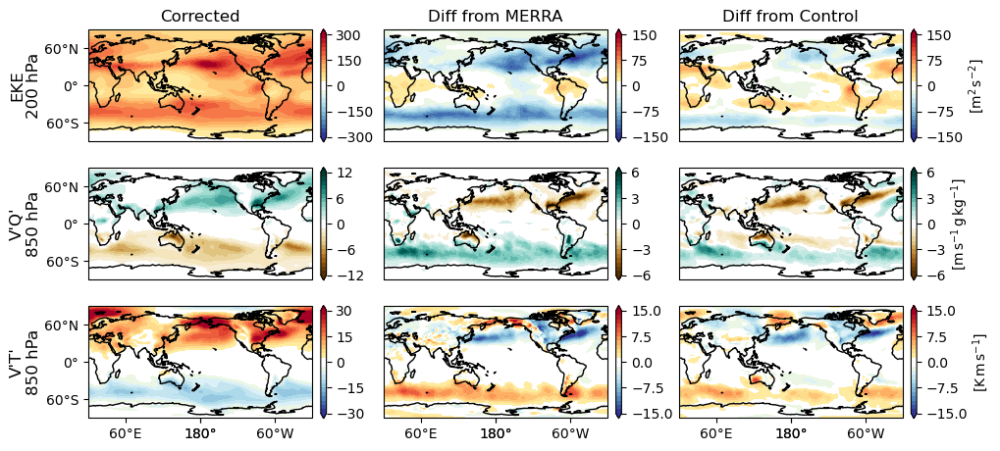

In [140]:
plot_transient_eddies_and_bias(transients_corrected, transients_obs, transients_control, 'UVQ', fig_dir / f'{TIME_LABEL}_transients.png')

# Figure 11,12: Blocking

In [88]:
def find_gradient_blocks(z500, zvar="Z500", min_days=5, min_lat=30, max_lat=75, lat_offset=15, north_threshold=150, 
                         mons=np.arange(1, 13), return_mask=False):

    if isinstance(z500, xr.Dataset):
        z500 = z500[zvar]
    if z500.lat[0] > z500.lat[-1]:
        z500 = z500.sortby("lat")

    #z500 = z500.where(z500.time.dt.month.isin(mons), drop=True)
    lat_reg = z500.lat.sel(lat=slice(min_lat, max_lat))

    z0 = z500.sel(lat=lat_reg)
    zS = z500.sel(lat=lat_reg - lat_offset, method="nearest").assign_coords(lat=lat_reg)
    zN = z500.sel(lat=lat_reg + lat_offset, method="nearest").assign_coords(lat=lat_reg)

    candidate_block = ((z0 - zS) > 0) & ((z0 - zN) > north_threshold)
    block = candidate_block.rolling(time=min_days).sum() >= min_days

    block = block.rolling(time=min_days).max().shift(time=-(min_days - 1)).fillna(False).astype(bool)

    block = block.where(block.time.dt.month.isin(mons), drop=True)

    if return_mask:
        return block
    else:
        return block.mean(dim='time'), block.any('lat').mean('time')

In [89]:
def regional_block_index(block_mask,lon_bounds=None,lat_bounds=None,area_fraction_threshold=0.0):
    """
    Convert a gridded blocking mask into a Boolean regional event index.
    With area_fraction_threshold=0, any blocked grid cell triggers an event.
    """
    mask = block_mask

    if lat_bounds is not None:
        mask = mask.sel(lat=slice(*lat_bounds))
    if lon_bounds is not None:
        lon0, lon1 = lon_bounds
        # Convert 0–360 longitudes to -180–180 if necessary.
        if lon0 < 0:
            mask = mask.assign_coords(lon=((mask.lon + 180) % 360) - 180).sortby("lon")
        mask = mask.sel(lon=slice(lon0, lon1))

    weights = np.cos(np.deg2rad(mask.lat)).broadcast_like(mask)

    blocked_area_fraction = (weights.where(mask, 0).sum(("lat", "lon")) / weights.sum(("lat", "lon")))

    event = blocked_area_fraction > area_fraction_threshold
    event.name = "blocking_event"

    return event

In [90]:
def decompose_blocking_z500_bias(model_z500,obs_z500,model_block,obs_block,time_dim="time"):

    #model_block = model_block.astype(bool)
    #obs_block = obs_block.astype(bool)

    # Blocking frequencies.
    f = model_block.mean(time_dim)
    f_hat = obs_block.mean(time_dim)

    # Conditional model means.
    z_b = model_z500.where(model_block).mean(time_dim)
    z_z = model_z500.where(~model_block).mean(time_dim)

    # Conditional observed means.
    z_b_hat = obs_z500.where(obs_block).mean(time_dim)
    z_z_hat = obs_z500.where(~obs_block).mean(time_dim)

    frequency_bias = (f - f_hat) * (z_b - z_z)
    pattern_bias = f_hat * ((z_b - z_b_hat) - (z_z - z_z_hat))
    nonblocked_bias = z_z - z_z_hat
    reconstructed_bias = (frequency_bias + pattern_bias + nonblocked_bias)

    direct_bias = (model_z500.mean(time_dim) - obs_z500.mean(time_dim))
    #direct_bias = weighted_monthly_mean(model_z500.groupby("time.month").mean("time")) - weighted_monthly_mean(obs_z500.groupby("time.month").mean("time"))

    residual = direct_bias - reconstructed_bias

    result = xr.Dataset(
        {"frequency_bias": frequency_bias,
         "pattern_bias": pattern_bias,
         "nonblocked_bias": nonblocked_bias,
         "reconstructed_bias": reconstructed_bias,
         "direct_bias": direct_bias,
         "residual": residual} )
        
    return result

In [91]:
def block_stats(event, dim='time'):
    event = event.fillna(False).astype(bool)

    # True on the first day of each contiguous blocking event
    starts = event & ~event.shift({dim: 1}, fill_value=False)

    n_events = starts.sum(dim)
    n_days = event.sizes[dim]
    blocked_days = event.sum(dim)
    mean_duration = xr.where(n_events > 0, blocked_days / n_events, 0)

    return n_events, mean_duration, n_days

In [108]:
def plot_blocking_figure(blocks, block_lats, output_path):
    
    fig = plt.figure(figsize=(9, 9))
    gs = fig.add_gridspec(2, 2, height_ratios=[1, 1.5], hspace=0.25, wspace=0.1)
    ax_line = fig.add_subplot(gs[0, :])
    axs = [fig.add_subplot(gs[1, i], projection=ccrs.NorthPolarStereo()) for i in range(2)]

    blocks_corr, blocks_control, blocks_obs = blocks
    latitude = blocks_corr.lat
    blocks_corr, corr_lons = add_cyclic_point(blocks_corr, coord=blocks_corr.lon)
    blocks_control, control_lons = add_cyclic_point(blocks_control, coord=blocks_control.lon)
    blocks_obs, obs_lons = add_cyclic_point(blocks_obs, coord=blocks_obs.lon)
    
    biases = [blocks_control - blocks_obs, blocks_corr - blocks_obs]
    titles = ["Control", "Corrected"]

    levels = np.linspace(-0.1, 0.1, 25)
    cmap = cmap_white_center(levels, "RdBu_r")
    extent=(-180, 180, 35, 90)

    ax_line.plot(block_lats[0].lon, block_lats[0], linewidth=2, label="Corrected")
    ax_line.plot(block_lats[1].lon, block_lats[1], linewidth=2, label="Control")
    ax_line.plot(block_lats[2].lon, block_lats[2], linewidth=2, linestyle="--",
                 color="grey", label="Obs")
    ax_line.set(xlabel="Longitude", ylabel="Blocking fraction",
                title="DJF blocking frequency 35–75°N")
    #ax_line.set_xticks(xticks, crs=data_crs)
    ax_line.xaxis.set_major_formatter(cticker.LongitudeFormatter())
    ax_line.legend(bbox_to_anchor=(.15,.98),fontsize=10)
    
    for ax, bias, title in zip(axs, biases, titles):
        cf = ax.contourf(obs_lons, latitude, bias, levels=levels, cmap=cmap,
                         extend="both", transform=ccrs.PlateCarree())
        ax.set_title(title)
        ax.set_extent(extent, crs=ccrs.PlateCarree())
        ax.coastlines(linewidth=0.8)
        gl = ax.gridlines(linewidth=0.5, linestyle="--", alpha=0.5)

    cbar = fig.colorbar(cf, ax=axs, orientation="horizontal", fraction=0.05, pad=0.05)
    ticks = cbar.get_ticks()
    cbar.set_ticks(ticks[::2])
    cbar.set_label("Blocking fraction bias")

    # Panel labels
    ax_line.text(0.01, 1.1, "(a)",transform=ax_line.transAxes,ha="left", va="top",fontsize=14, fontweight="bold")
    axs[0].text(0.01, 1.07, "(b)",transform=axs[0].transAxes,ha="left", va="top",fontsize=14, fontweight="bold")

    fig.savefig(output_path, bbox_inches="tight", dpi=300)
    plt.show()

In [93]:
def plot_blocking_bias_components(components, lon_bounds, lat_min=30, rectangle_bounds=[(-30,40), (35,75)],
                                  levels=np.arange(-100, 110, 10), output_path=''):
    fields = [
        ("direct_bias", "Z500 bias"),
        ("nonblocked_bias", "Non-blocked bias"),
        ("frequency_bias", "Block frequency bias"),
        ("pattern_bias", "Block pattern bias"),
    ]

    fig, axes = plt.subplots(len(components), len(fields), figsize=(12, 7),
                             subplot_kw={"projection": ccrs.NorthPolarStereo()})

    cmap = cmap_white_center(levels, "RdBu_r")
    row_titles = ['Control','Corrected']

    for row, component in enumerate(components):
        for ax, (name, title) in zip(axes[row], fields):
            field = component[name].sel(lat=slice(lat_min, 80))
            plotlat = field.lat
    
            # Convert 0–360 longitudes to -180–180 if necessary.
            lon0, lon1 = lon_bounds
            if lon0 < 0:
                field = field.assign_coords(lon=((field.lon + 180) % 360) - 180).sortby("lon")
            field = field.sel(lon=slice(lon0, lon1))
            field, field_lons = add_cyclic_point(field, coord=field.lon)
    
            contour = ax.contourf(field_lons, plotlat, field, levels=levels, cmap=cmap,
                                  extend="both", transform=ccrs.PlateCarree())
            ax.contour(field_lons, plotlat, field, levels=np.arange(-100,0,10)+np.arange(10,101,10),
                       colors='grey',transform=ccrs.PlateCarree())
            ax.set_extent([-180, 180, lat_min, 90], crs=ccrs.PlateCarree())
            ax.coastlines(linewidth=0.8)
            
            gl = ax.gridlines(linewidth=0.5, linestyle="--", alpha=0.5)
            if row == 0:
                ax.set_title(title)
    
            rect_lon, rect_lat = rectangle_bounds
            # Plot regional boundary
            lons = np.linspace(*rect_lon, 100)
            lats = np.linspace(*rect_lat, 100)
            ax.plot(lons, np.full_like(lons, rect_lat[0]), color="black", linewidth=2,
                    transform=ccrs.PlateCarree())
            ax.plot(lons, np.full_like(lons, rect_lat[1]), color="black", linewidth=2,
                    transform=ccrs.PlateCarree())
            ax.plot(np.full_like(lats, rect_lon[0]), lats, color="black", linewidth=2,
                    transform=ccrs.PlateCarree())
            ax.plot(np.full_like(lats, rect_lon[1]), lats, color="black", linewidth=2,
                    transform=ccrs.PlateCarree())
        axes[row, 0].text(-0.1, 0.5, row_titles[row], rotation=90, va="center", ha="center",
                          transform=axes[row, 0].transAxes, fontsize=14)

    fig.subplots_adjust(wspace=0.05, hspace=0.1)
    cbar = fig.colorbar(contour, ax=axes, orientation="horizontal", pad=0.05, shrink=0.5)
    cbar.set_label(f"[m]")

    #fig.savefig(output_path, bbox_inches="tight", dpi=300)
    plt.show()

In [96]:
control_case = 'cam_control'
corrected_case = 'apply_nudge30_coef_1'; iteration="iter7"
case_names = ['Control','Corrected']
ANALYSIS_YEARS = np.arange(1980,2010) 

In [97]:
control_dir = f'/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/{control_case}/atm/hist/{control_case}'
corrected_dir = f'/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/{corrected_case}/atm/hist/{iteration}/{corrected_case}'
MERRA_DIR = '/n/home04/sweidman/holylfs06/MERRA2_OG/'

In [98]:
z3_file = xr.open_dataset(f'{corrected_dir}.Z500.{ANALYSIS_YEARS[0]}-{ANALYSIS_YEARS[-1]}.nc')
z3_control = xr.open_dataset(f'{control_dir}.Z500.{ANALYSIS_YEARS[0]}-{ANALYSIS_YEARS[-1]}.nc')
z3_obs = xr.open_dataset(f'{MERRA_DIR}MERRA2_H500.1980-2009_fixed.nc')
z3_obs = z3_obs.assign_coords(lon=z3_obs.lon % 360).sortby("lon")
z3_periodic = xr.concat([z3_obs.assign_coords(lon=z3_obs.lon - 360),
                         z3_obs,
                         z3_obs.assign_coords(lon=z3_obs.lon + 360)], dim="lon").sortby("lon")
z3_obs_interp = z3_periodic.interp(lat=z3_file.lat, lon=z3_file.lon, method='linear',kwargs={"fill_value": "extrapolate"}) 
z3_obs_interp.loc[{"lat": -90}] = z3_obs_interp.sel(lat=-90).mean("lon")
z3_obs_interp.loc[{"lat":  90}] = z3_obs_interp.sel(lat= 90).mean("lon")
z3_obs_interp = z3_obs_interp.sel(time=slice('1980-01-01', '2009-12-31'))

In [99]:
mons = [12,1,2]
min_lat = 35
min_days = 5

In [100]:
blocks,blocks_lat = find_gradient_blocks(z3_file,zvar="Z500",min_days=min_days,min_lat=min_lat,max_lat=75,lat_offset=15,north_threshold=150, mons=mons)
blocks_control, blocks_control_lat = find_gradient_blocks(z3_control,zvar="Z500",min_days=min_days,min_lat=min_lat,max_lat=75,lat_offset=15,north_threshold=150, mons=mons)
blocks_obs,blocks_obs_lat = find_gradient_blocks(z3_obs_interp,zvar="H500",min_days=min_days,min_lat=min_lat,max_lat=75,lat_offset=15,north_threshold=150, mons=mons)

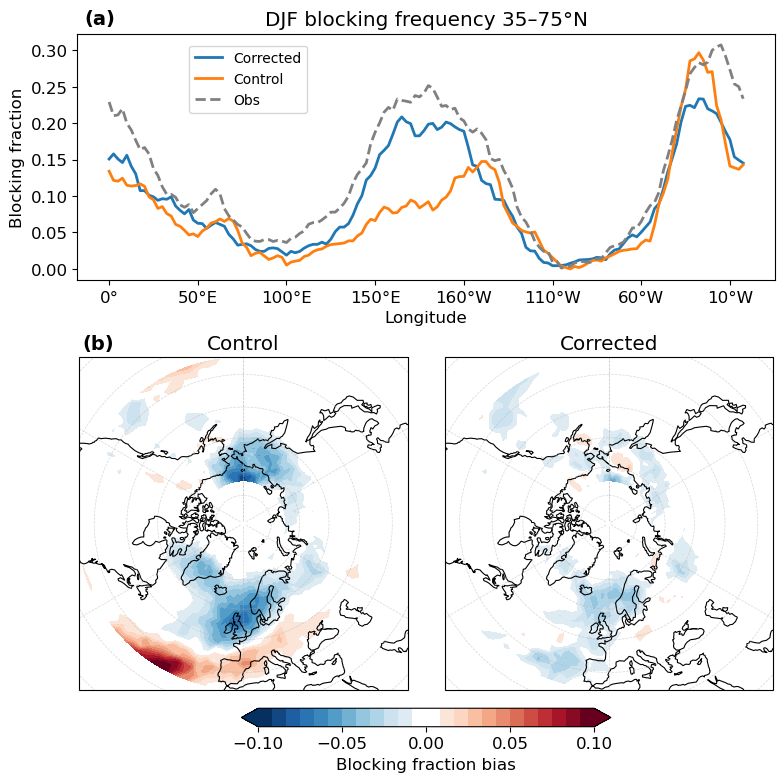

In [109]:
block_sets = [blocks, blocks_control, blocks_obs]
block_lat_sets = [blocks_lat, blocks_control_lat, blocks_obs_lat]
plot_blocking_figure(block_sets, block_lat_sets, fig_dir / f'block_freq.png')

In [85]:
blocks_obs = find_gradient_blocks(z3_obs_interp,zvar="H500",
                                  min_days=min_days,min_lat=min_lat,max_lat=75,lat_offset=15,north_threshold=150,
                                  mons=[1,2,12], return_mask=True)
blocks_corr = find_gradient_blocks(z3_file,zvar="Z500",
                                  min_days=min_days,min_lat=min_lat,max_lat=75,lat_offset=15,north_threshold=150,
                                  mons=[1,2,12], return_mask=True)
blocks_cont = find_gradient_blocks(z3_control,zvar="Z500",
                                  min_days=min_days,min_lat=min_lat,max_lat=75,lat_offset=15,north_threshold=150,
                                  mons=[1,2,12], return_mask=True)

In [86]:
lonBounds=(120,210); latbounds=(40,75); lonplot = (90,270); region_name='Pac'
#lonBounds=(-30,40); latbounds=(35,75); lonplot = (-90,90); region_name = 'Atl'
rect_bounds = [lonBounds,latbounds]
events_obs = regional_block_index(blocks_obs, lon_bounds=lonBounds, lat_bounds=latbounds, area_fraction_threshold=0.02)
events_corr = regional_block_index(blocks_corr, lon_bounds=lonBounds, lat_bounds=latbounds, area_fraction_threshold=0.02)
events_cont = regional_block_index(blocks_cont, lon_bounds=lonBounds, lat_bounds=latbounds, area_fraction_threshold=0.02)

In [87]:
model_z500 = z3_file['Z500'].where(z3_file.time.dt.month.isin([12,1,2]), drop=True)
cont_z500 = z3_control['Z500'].where(z3_control.time.dt.month.isin([12,1,2]), drop=True)
obs_z500 = z3_obs_interp['H500'].where(z3_obs_interp.time.dt.month.isin([12,1,2]), drop=True)

In [88]:
biases_corr = decompose_blocking_z500_bias(model_z500,obs_z500,events_corr,events_obs,time_dim="time")
biases_cont = decompose_blocking_z500_bias(cont_z500,obs_z500,events_cont,events_obs,time_dim="time")

In [89]:
n_obs, mu_obs, days_obs = block_stats(events_obs)
n_corr, mu_corr, days_corr = block_stats(events_corr)
n_cont, mu_cont, days_cont = block_stats(events_cont)

print('Obs n events, mean duration: ', n_obs.values, mu_obs.values)
print('Corr n events, mean duration: ', n_corr.values, mu_corr.values)
print('Cont n events, mean duration: ', n_cont.values, mu_cont.values)

Obs n events, mean duration:  92 8.391304347826088
Corr n events, mean duration:  82 8.073170731707316
Cont n events, mean duration:  47 6.787234042553192


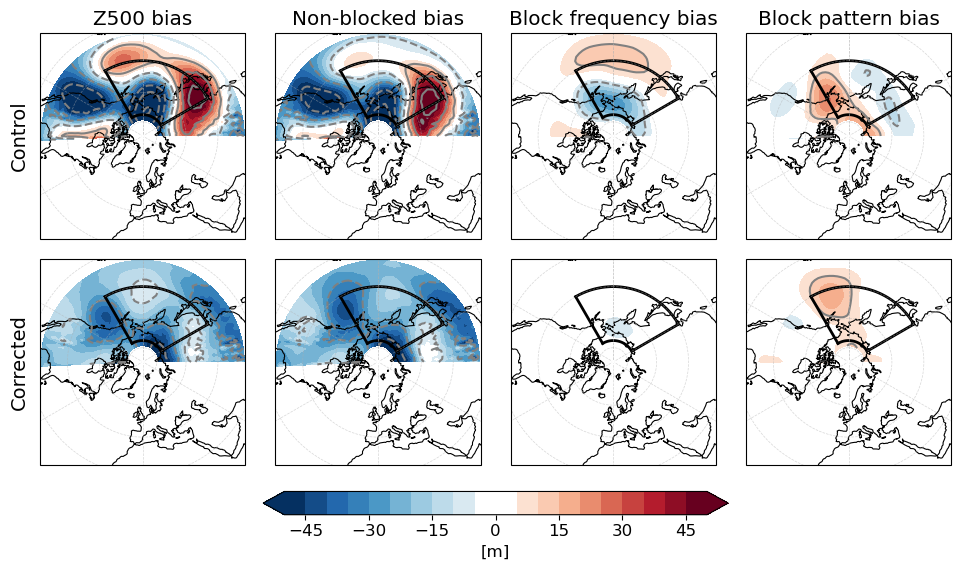

In [96]:
bias_components = [biases_cont,biases_corr]
plot_blocking_bias_components(bias_components,lonplot,25, rect_bounds,levels=np.arange(-50,51,5),
                              output_path = fig_dir / f'{region_name}_block_bias_decomp.png')

# Other supplementary figures

## Horizontal bias for other variables / levels

In [30]:
control_case = 'cam_control'
corrected_case = 'apply_nudge30_coef_1'; iteration='iter9'
case_names = ['Control','Corrected']

In [31]:
control_dir = f'/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/{control_case}/atm/hist/{control_case}'
corrected_dir = f'/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/{corrected_case}/atm/hist/{iteration}/{corrected_case}'
MERRA_DIR = '/n/home04/sweidman/holylfs06/MERRA2_OG/MERRA2_f19/'; CLIMO="monave30"

In [39]:
ANALYSIS_YEARS = np.arange(1980,2010)
REGRID=True; EXTRAP=False
DO_SURFACE=True
DO_TOA=False

plot_configs = {'U': {'clev': np.arange(-5, 5.1, .5),
                      'clab': '[m/s]','levels': [850]},
                'V': {'clev': np.arange(-3, 3.1, 0.3),
                      'clab': '[m/s]','levels': [250]},
                'T': {'clev': np.arange(-10, 10.1, 1.),
                      'clab': '[K]','levels': [850, 250]}}

In [42]:
#MONTHS = [12,1,2]; TIME_LABEL='DJF'
MONTHS = [6,7,8]; TIME_LABEL='JJA'
control_ds, control_diff, control_interp, merra_ds, pr_diff = corrtools.calculate_bias_ds(control_dir, MERRA_DIR, ANALYSIS_YEARS, MONTHS, CLIMO, REGRID, DO_SURFACE, DO_TOA, EXTRAP)
corrected_ds, corrected_diff, corrected_interp, merra_ds, pr_diff = corrtools.calculate_bias_ds(corrected_dir, MERRA_DIR, ANALYSIS_YEARS, MONTHS, CLIMO, REGRID, DO_SURFACE, DO_TOA, EXTRAP)
cases = {"Control": control_diff, "Corrected": corrected_diff}

/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/cam_control/atm/hist/cam_control
regrid model to plev
regrid MERRA to plev
Mean precip bias 0.03494229042254314
% diff 0.01424071507188492
/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/cam_control/atm/hist/cam_control
/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/cam_control/atm/hist/cam_control
/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/cam_control/atm/hist/cam_control
regrid model to plev
Mean MERRA precip bias 0.16907716609924608
/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/apply_nudge30_coef_1/atm/hist/iter9/apply_nudge30_coef_1
regrid model to plev
regrid MERRA to plev
Mean precip bias -0.03693186949511161
% diff -0.015051567146629096
/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/apply_nudge30_coef_1/atm/hist/iter9/apply_nudge30_coef_1
/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/apply_nudge30_coef_1/atm/hist/iter9/apply_nudge3

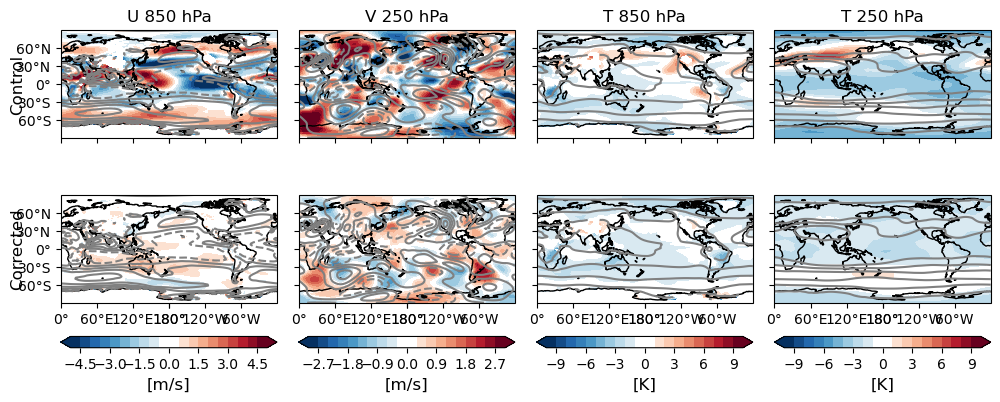

In [43]:
plot_lat_vs_lon_bias_comparison(cases, merra_ds, plot_configs, fig_dir / f'si_{TIME_LABEL}_lonxlat_extra.png')

## Average normalized bias by integration length for non-integrated climatological nudging

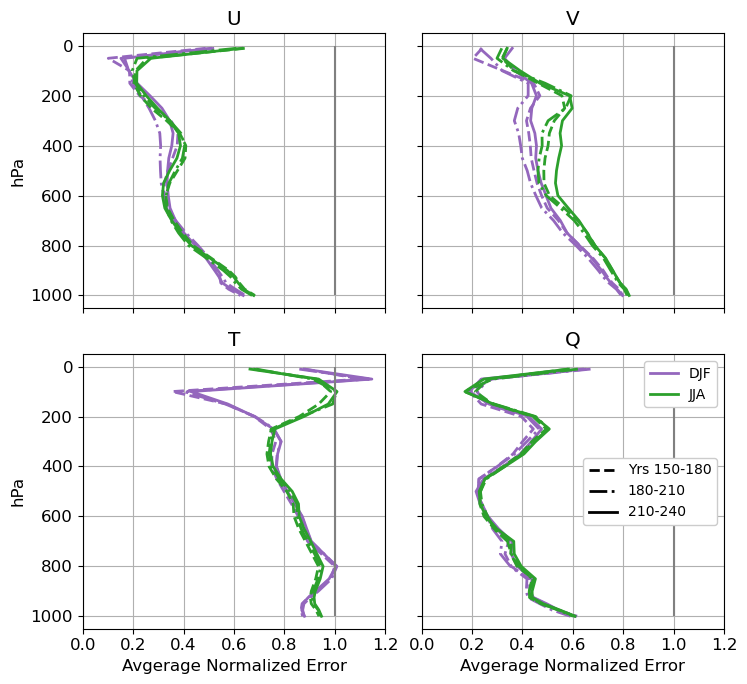

In [85]:
case = 'apply_nudge30_integrate_false'

file_path = '/n/home04/sweidman/mean_state_corrector/corrector_scripts/diagnostic_outputs/'

# plot 3 datasets
bbox = (0.55,1)
fig, axs = plt.subplots(2, 2, figsize=(7.5, 7), sharey=True, sharex=True)

variables = ['U', 'V', 'T', 'Q']
seasons = ['DJF','JJA']
#colors = ['tab:blue','tab:red','tab:orange','tab:purple']
colors = ['tab:purple','tab:green']
linewidths = [2,2,2,2,2,2]
axs = axs.flatten()

iteration_styles = {"Yrs 150-180": "--","180-210": "-.","210-240":"-"}

for i, var in enumerate(variables):
    ax = axs[i]
    for j, time_period in enumerate(seasons):

        errors_data = xr.open_dataset(file_path+case+f'/i6_30/{time_period}/{time_period}_norm_error.nc', decode_times=False)
        has_lev = 'lev' in errors_data.dims
        vert_coord = errors_data.lev if has_lev else errors_data.plev
        ax.plot(errors_data[var], vert_coord, linestyle='--', color=colors[j],linewidth=2)

        try:
            errors_data = xr.open_dataset(file_path+case+f'/i7_30/{time_period}/{time_period}_norm_error.nc', decode_times=False)
            has_lev = 'lev' in errors_data.dims
            vert_coord = errors_data.lev if has_lev else errors_data.plev
            ax.plot(errors_data[var], vert_coord, linestyle='-.', color=colors[j],linewidth=2)
        except:
            print(f'no data iter7 {filename}')

        errors_data = xr.open_dataset(file_path+case+f'/{time_period}/{time_period}_norm_error.nc', decode_times=False)
        has_lev = 'lev' in errors_data.dims
        vert_coord = errors_data.lev if has_lev else errors_data.plev
        ax.plot(errors_data[var], vert_coord, linestyle='-', color=colors[j],linewidth=2)

    ax.vlines(1, 0, 1000, 'grey','solid')
    ax.set_title(var)
    if i%2==0:
        ax.set_ylabel('hPa')
    if i>1:
        ax.set_xlabel('Avgerage Normalized Error')
    #ax.set_xlim([0,1.75])
    ax.set_xlim([0,1.2])
    ax.grid("true")

axs[1].invert_yaxis()

# One handle for each case/color
case_handles = [Line2D([0], [0],color=colors[j],linestyle="-",linewidth=2,label=time_period) for j, time_period in enumerate(seasons)]

# One handle for each iteration/linestyle
iteration_handles = [Line2D([0], [0],color="black",linestyle=linestyle,linewidth=2,label=iteration) for iteration, linestyle in iteration_styles.items()]

case_legend = axs[3].legend(handles=case_handles,loc="upper right",fontsize=10,framealpha=1)
axs[3].add_artist(case_legend)
axs[3].legend(handles=iteration_handles,loc="center right",fontsize=10,framealpha=1)

#axs[1].legend(bbox_to_anchor=bbox,fontsize=10,framealpha=1)
plt.tight_layout()
plt.show()
fig.savefig(fig_dir / f'si_normerror_tau_noint.png', bbox_inches='tight',dpi=300)

## Average normalized bias comparing nudging to corrected 

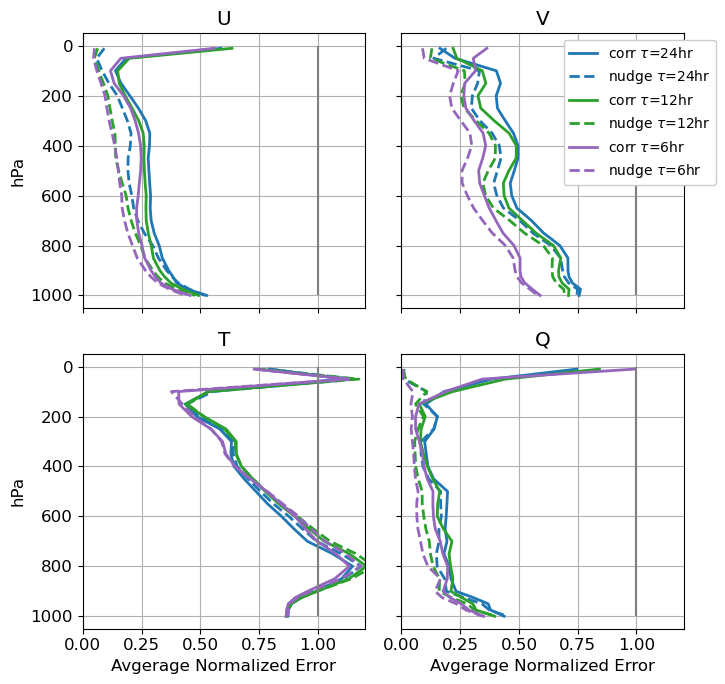

In [14]:
cases = {
    r"corr $\tau$=24hr": "apply_nudge30_uvq",
    r"nudge $\tau$=24hr": "nudge30_uvq", 
    r"corr $\tau$=12hr": "apply_nudge30_coef_0.5",
    r"nudge $\tau$=12hr": "nudge30_coef_0.5", 
    r"corr $\tau$=6hr": "apply_nudge30_coef_1",
    r"nudge $\tau$=6hr": "nudge30_coef_1"
}

file_path = '/n/home04/sweidman/mean_state_corrector/corrector_scripts/diagnostic_outputs/'

time_period = 'DJF'
fig, axs = plt.subplots(2, 2, figsize=(7.5, 7), sharey=True, sharex=True)

variables = ['U', 'V', 'T', 'Q']
#colors = ['tab:blue','tab:red','tab:orange','tab:purple']
colors = ['tab:blue','tab:blue','tab:green','tab:green','tab:purple','tab:purple']
linetypes = ['-','--','-','--','-','--']
linewidths = [2,2,2,2,2,2]
axs = axs.flatten()

for i, var in enumerate(variables):

    ax = axs[i]
    
    for j, (label, filename) in enumerate(cases.items()):

        try:
            errors_data = xr.open_dataset(file_path+filename+f'/i8/{time_period}/{time_period}_norm_error.nc', decode_times=False)
        except FileNotFoundError:
            errors_data = xr.open_dataset(file_path+filename+f'/i8_30/{time_period}/{time_period}_norm_error.nc', decode_times=False)
        has_lev = 'lev' in errors_data.dims
        vert_coord = errors_data.lev if has_lev else errors_data.plev
        ax.plot(errors_data[var], vert_coord, linestyle=linetypes[j], color=colors[j], 
                linewidth=linewidths[j],label = label)

    ax.vlines(1, 0, 1000, 'grey','solid')
    ax.set_title(var)
    if i%2==0:
        ax.set_ylabel('hPa')
    if i>1:
        ax.set_xlabel('Avgerage Normalized Error')
    #ax.set_xlim([0,1.75])
    ax.set_xlim([0,1.2])
    ax.grid("true")

axs[1].invert_yaxis()
axs[1].legend(bbox_to_anchor=(.55,1),fontsize=10,framealpha=1)
plt.tight_layout()
plt.show()
fig.savefig(fig_dir / f'si_normerror_{time_period}_converge.png', bbox_inches='tight',dpi=300)

## Diagnostics

In [44]:
def plot_lat_vs_lon_diagnostics(cases, merra_var, plot_configs, output_path):

    case_names = list(cases)

    panels = [var for var in plot_configs.keys()]
    nrows, ncols = len(panels), len(case_names)
    projection, data_crs = ccrs.PlateCarree(central_longitude=180), ccrs.PlateCarree()

    fig, axes = plt.subplots(nrows, ncols,figsize=(8, 14),subplot_kw={"projection": projection}) #formerly (8,14)
    
    xticks = np.arange(-180, 181, 60) 
    yticks = np.arange(-60, 61, 30)

    contour_sets = {}

    for col, case_name in enumerate(case_names):
        
        raw_ds = cases[case_name]

        for row,var in enumerate(panels):
            
            ax, config = axes[row, col], plot_configs[var]
            cmap = cmap_white_center(config["clev"], "Spectral_r")

            raw_var = raw_ds[var]
            ref_var = merra_var[var]

            bias_field = corrtools.weighted_monthly_mean(raw_var - ref_var)
            reference_field = corrtools.weighted_monthly_mean(ref_var)
            bias_rmse = corrtools.compute_weighted_rmse_season(raw_var, ref_var)
            
            bias_cyclic, bias_lons = add_cyclic_point(bias_field.values, coord=bias_field.lon.values)
            ref_cyclic, ref_lons = add_cyclic_point(reference_field.values, coord=reference_field.lon.values)

            filled = ax.contourf(bias_lons, bias_field.lat, bias_cyclic, levels=config["clev"], cmap=cmap,
                                 extend="both", transform=data_crs)
            ax.contour(ref_lons, reference_field.lat, ref_cyclic, colors='grey', linewidths=1, transform=data_crs)
            contour_sets[row] = filled

            ax.text(0.07, 1.05, np.round(bias_rmse.item(),2), transform=ax.transAxes, ha="center", va="center")

            ax.coastlines()
            ax.set_xticks(xticks, crs=data_crs)
            ax.set_yticks(yticks, crs=data_crs)
            ax.xaxis.set_major_formatter(cticker.LongitudeFormatter())
            ax.yaxis.set_major_formatter(cticker.LatitudeFormatter())

            ax.tick_params(axis="x",which="both",bottom=True,top=False,labelbottom=(row == nrows - 1),labelsize=10)
            ax.tick_params(axis="y",which="both",left=True,right=False,labelleft=(col == 0),labelsize=10)

            if row == 0:
                ax.set_title(case_name,fontsize=14)

            if col == 0:
                ax.text(-0.2, 0.5, config["varname"], transform=ax.transAxes, rotation=90, ha="center", va="center", fontsize=14)

    fig.subplots_adjust(hspace=0.15, wspace=0.1)
    
    for row, var in enumerate(panels):
        right_ax = axes[row, -1]
        pos = right_ax.get_position()
        cax = fig.add_axes([pos.x0 + .4, pos.y0, 0.02, pos.height])
        cbar = fig.colorbar(contour_sets[row], cax=cax, label=plot_configs[var]["clab"])
        ticks = cbar.get_ticks()
        cbar.set_ticks(ticks[::2])
        cbar.ax.tick_params(labelsize=10)
        

    fig.savefig(output_path, bbox_inches="tight", dpi=300)
    #plt.close(fig)

In [45]:
control_case = 'cam_control_6hr'
corrected_case = 'apply_nudge30_coef_1'; iteration='iter9'
case_names = ['Control','Corrected']

In [46]:
control_dir = f'/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/{control_case}/atm/hist/{control_case}'
corrected_dir = f'/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/{corrected_case}/atm/hist/{iteration}/{corrected_case}'
# TODO: change to MERRA 30-year directory
MERRA_DIR = '/n/home04/sweidman/holylfs06/MERRA2_OG/MERRA2_f19/'; CLIMO="monave30"

In [47]:
ANALYSIS_YEARS = np.arange(1980,2010)
REGRID=False
DO_SURFACE=True
DO_TOA=True

plot_configs = {'SHFLX': {'clev': np.linspace(-50,50,25),'clab': '[W/m^2]','varname':'SH Flux'},
                'LHFLX': {'clev': np.linspace(-50,50,25),'clab': '[W/m^2]','varname':'LH Flux'},
                'TREFHT': {'clev': np.linspace(-10,10,25),'clab': '[K]','varname':'T2m'},
                'SWCF': {'clev':np.linspace(-50,50,25),'clab': '[W/m^2]','varname':'SWCF'},
                'LWCF': {'clev':np.linspace(-30,30,25),'clab': '[W/m^2]','varname':'LWCF'},
                'CLDTOT': {'clev': np.linspace(-.75,.75,25),'clab': '[fraction]','varname':'Cloud fraction'}}#,
                #'OMEGA500': {'clev': np.linspace(-.05,.05,25),'clab': 'Pa / s','varname':'Omega 500'}}

In [48]:
MONTHS = [12,1,2]; TIME_LABEL='DJF'
control_ds, control_diff, control_interp, merra_ds, pr_diff = corrtools.calculate_bias_ds(control_dir, MERRA_DIR, ANALYSIS_YEARS, MONTHS, CLIMO, REGRID, DO_SURFACE, DO_TOA)
corrected_ds, corrected_diff, corrected_interp, merra_ds, pr_diff = corrtools.calculate_bias_ds(corrected_dir, MERRA_DIR, ANALYSIS_YEARS, MONTHS, CLIMO, REGRID, DO_SURFACE, DO_TOA)
cases = {"Control": control_ds, "Corrected": corrected_ds}

/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/cam_control_6hr/atm/hist/cam_control_6hr
Mean precip bias 0.057282010417172784
% diff 0.025542311166176078
/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/cam_control_6hr/atm/hist/cam_control_6hr
/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/cam_control_6hr/atm/hist/cam_control_6hr
/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/cam_control_6hr/atm/hist/cam_control_6hr
regrid model to plev
Mean MERRA precip bias 0.1265234797398992
/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/cam_control_6hr/atm/hist/cam_control_6hr
/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/apply_nudge30_coef_1/atm/hist/iter9/apply_nudge30_coef_1
Mean precip bias -0.014437319314569319
% diff -0.006437666898430311
/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/apply_nudge30_coef_1/atm/hist/iter9/apply_nudge30_coef_1
/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/arch

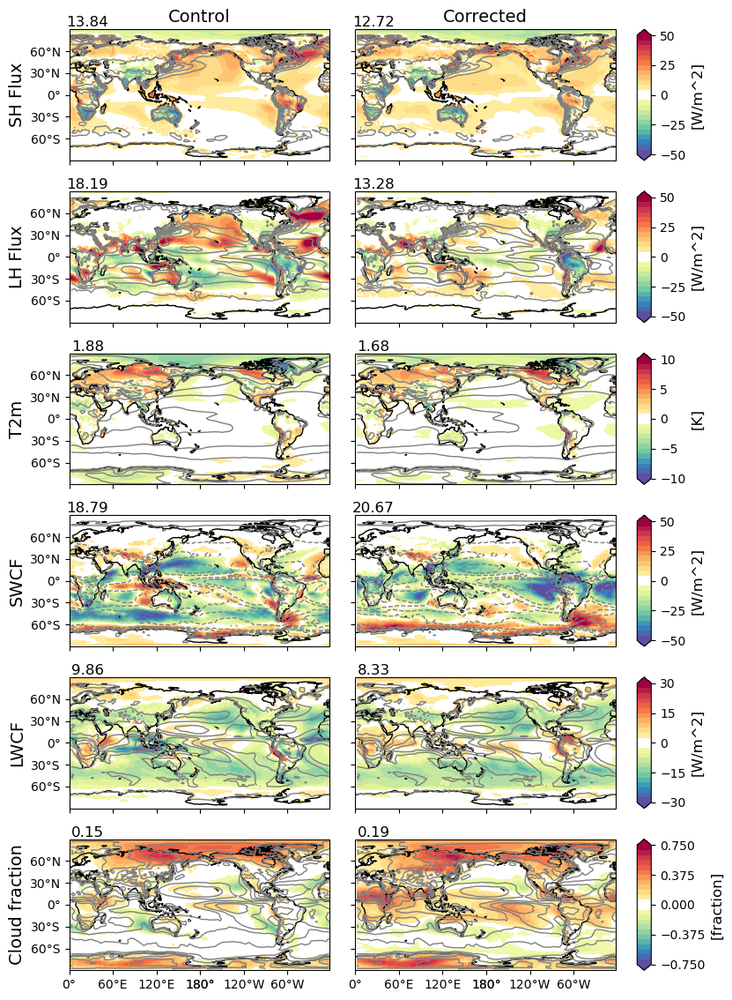

In [49]:
plot_lat_vs_lon_diagnostics(cases, merra_ds, plot_configs, fig_dir / f'si_{TIME_LABEL}_diagnostic_maps.png')

In [50]:
MONTHS = [6,7,8]; TIME_LABEL='JJA'
control_ds, control_diff, control_interp, merra_ds, pr_diff = corrtools.calculate_bias_ds(control_dir, MERRA_DIR, ANALYSIS_YEARS, MONTHS, CLIMO, REGRID, DO_SURFACE, DO_TOA)
corrected_ds, corrected_diff, corrected_interp, merra_ds, pr_diff = corrtools.calculate_bias_ds(corrected_dir, MERRA_DIR, ANALYSIS_YEARS, MONTHS, CLIMO, REGRID, DO_SURFACE, DO_TOA)
cases = {"Control": control_ds, "Corrected": corrected_ds}

/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/cam_control_6hr/atm/hist/cam_control_6hr
Mean precip bias 0.03494229042254314
% diff 0.01424071507188492
/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/cam_control_6hr/atm/hist/cam_control_6hr
/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/cam_control_6hr/atm/hist/cam_control_6hr
/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/cam_control_6hr/atm/hist/cam_control_6hr
regrid model to plev
Mean MERRA precip bias 0.16907716609924608
/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/cam_control_6hr/atm/hist/cam_control_6hr
/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/apply_nudge30_coef_1/atm/hist/iter9/apply_nudge30_coef_1
Mean precip bias -0.03693186949511161
% diff -0.015051567146629096
/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/apply_nudge30_coef_1/atm/hist/iter9/apply_nudge30_coef_1
/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archiv

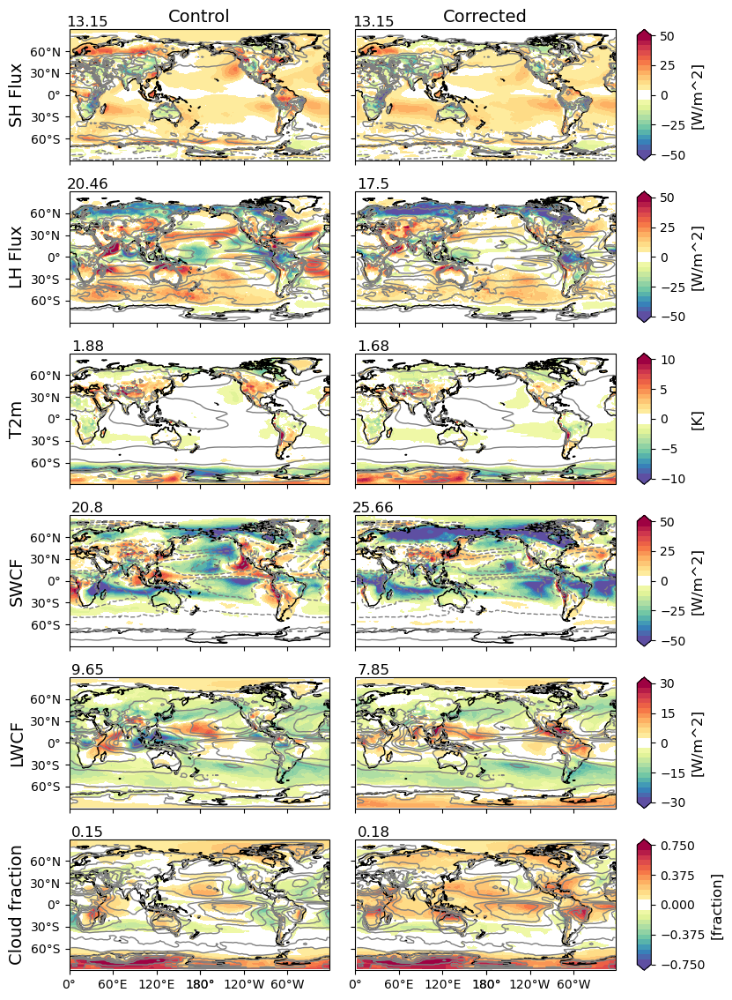

In [51]:
plot_lat_vs_lon_diagnostics(cases, merra_ds, plot_configs, fig_dir / f'si_{TIME_LABEL}_diagnostic_maps.png')

## Precipitation bias compared to GPCP

In [52]:
control_case = 'cam_control'
corrected_case = 'apply_nudge30_coef_1'; iteration='iter9'
case_names = ['Control','Corrected']
analysis_years = np.arange(1980,2010)

In [53]:
control_dir = f'/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/{control_case}/atm/hist/{control_case}'
corrected_dir = f'/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/{corrected_case}/atm/hist/{iteration}/{corrected_case}'

In [58]:
MONTHS=[12,1,2]; TIME_LABEL='DJF'
control_pr, model_pr, gpcp_pr, ncep_pr, merra_pr = open_precip_files(control_dir, corrected_dir, analysis_years, MONTHS, climo_set='monave30')
models = [control_pr, model_pr]
observations = [gpcp_pr]; obs_names = ['GPCP']

/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/cam_control/atm/hist/cam_control
/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/apply_nudge30_coef_1/atm/hist/iter9/apply_nudge30_coef_1


tropical pattern correlation:  [[<xarray.DataArray ()> Size: 8B
array(0.88068935)], [<xarray.DataArray ()> Size: 8B
array(0.9606396)]]


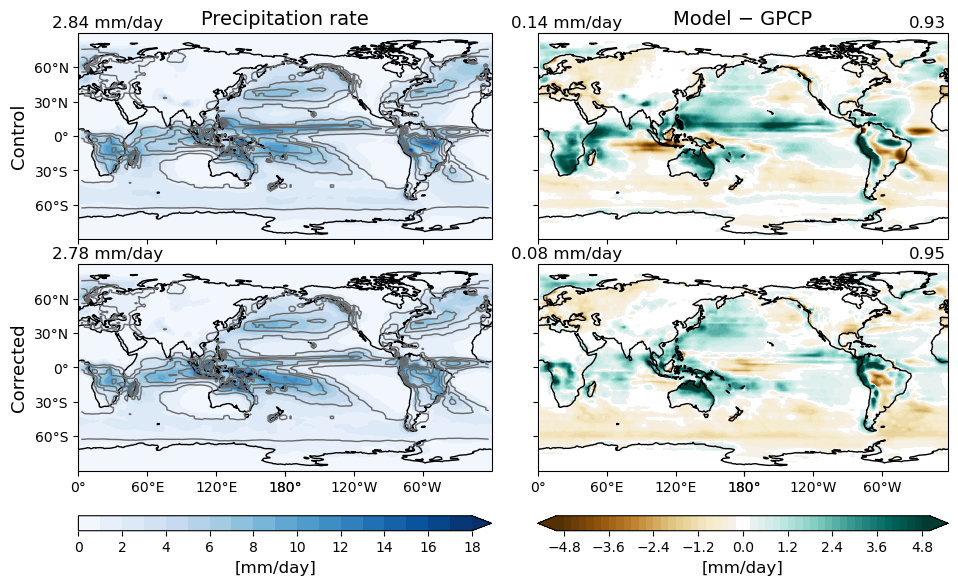

In [60]:
plot_lat_vs_lon_bias_pr(models, observations, case_names, obs_names, fig_dir / f'si_{TIME_LABEL}_pr_gpcp.png')

## Precipitation bias for corrected UVT, UV

In [93]:
control_case = 'cam_control'
corrected_case = 'apply_nudge30_uvt'
case_names = ['Control','Corrected UVT']
analysis_years = np.arange(1980,1990)

In [94]:
control_dir = f'/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/{control_case}/atm/hist/{control_case}'
corrected_dir = f'/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/{corrected_case}/atm/hist/{corrected_case}'

In [97]:
MONTHS=[12,1,2]; TIME_LABEL='DJF'
control_pr, model_pr, gpcp_pr, ncep_pr, merra_pr = open_precip_files(control_dir, corrected_dir, analysis_years, MONTHS, climo_set='monave30')
models = [control_pr, model_pr]
observations = [merra_pr]; obs_names = ['MERRA']

/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/cam_control/atm/hist/cam_control
/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/apply_nudge30_uvt/atm/hist/apply_nudge30_uvt


tropical pattern correlation:  [[<xarray.DataArray ()> Size: 8B
array(0.88847364)], [<xarray.DataArray ()> Size: 8B
array(0.89961561)]]


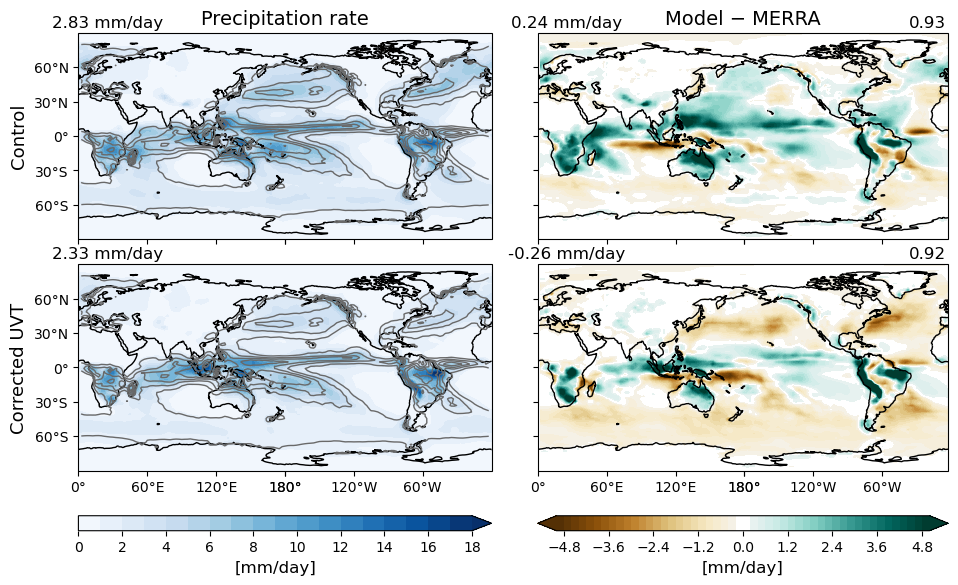

In [98]:
plot_lat_vs_lon_bias_pr(models, observations, case_names, obs_names, fig_dir / f'si_{TIME_LABEL}_pr_UVT.png')

## Bias plots for U,V only

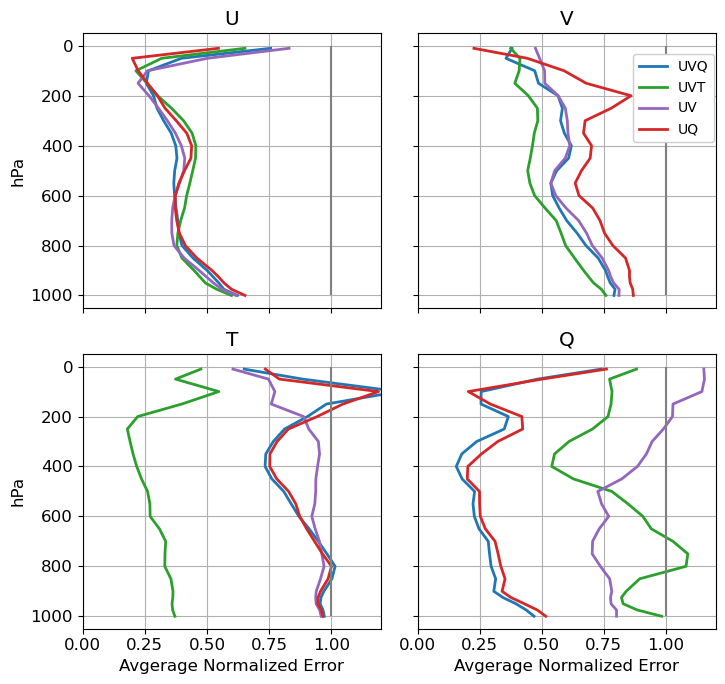

In [23]:
cases = {
    "UVQ": "apply_nudge30_uvq",
    "UVT": "apply_nudge30_uvt", 
    "UV": "apply_nudge30_uv",
    "UQ": "apply_nudge30_uq",
}

file_path = '/n/home04/sweidman/mean_state_corrector/corrector_scripts/diagnostic_outputs/'

#time_period = 'DJF'; bbox = (.6,.95)
time_period = 'JJA'; bbox = (.7,.95)
fig, axs = plt.subplots(2, 2, figsize=(7.5, 7), sharey=True, sharex=True)

variables = ['U', 'V', 'T', 'Q']
#colors = ['tab:blue','tab:red','tab:orange','tab:purple']
colors = ['tab:blue','tab:green','tab:purple','tab:red']
linetypes = ['-','-','-','-']
linewidths = [2,2,2,2]
axs = axs.flatten()

for i, var in enumerate(variables):

    ax = axs[i]
    
    for j, (label, filename) in enumerate(cases.items()):
        
        errors_data = xr.open_dataset(file_path+filename+f'/i6_10/{time_period}/{time_period}_norm_error.nc', decode_times=False)
        has_lev = 'lev' in errors_data.dims
        vert_coord = errors_data.lev if has_lev else errors_data.plev
        ax.plot(errors_data[var], vert_coord, linestyle=linetypes[j], color=colors[j], 
                linewidth=linewidths[j],label = label)

    ax.vlines(1, 0, 1000, 'grey','solid')
    ax.set_title(var)
    if i%2==0:
        ax.set_ylabel('hPa')
    if i>1:
        ax.set_xlabel('Avgerage Normalized Error')
    #ax.set_xlim([0,1.75])
    ax.set_xlim([0,1.2])
    ax.grid("true")

axs[1].invert_yaxis()
axs[1].legend(bbox_to_anchor=bbox,fontsize=10,framealpha=1)
plt.tight_layout()
plt.show()
fig.savefig(fig_dir / f'si_normerror_{time_period}_vars.png', bbox_inches='tight',dpi=300)

In [182]:
control_case = 'cam_control_6hr'
nudge_case = 'nudge30_uv'; iteration='iter7'
corrected_case = 'apply_nudge30_uv'
case_names = ['Control','Converged\nNudging','Corrected']

In [183]:
ANALYSIS_YEARS = np.arange(1980,1990)
REGRID=True
DO_SURFACE=True
DO_TOA=False

In [184]:
control_dir = f'/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/{control_case}/atm/hist/{control_case}'
nudge_dir = f'/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/{nudge_case}/atm/hist/{iteration}/{nudge_case}'
corrected_dir = f'/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/{corrected_case}/atm/hist/{iteration}/{corrected_case}'
MERRA_DIR = '/n/home04/sweidman/holylfs06/MERRA2_OG/MERRA2_f19/'; CLIMO="monave30"

In [185]:
MONTHS = [12,1,2]; TIME_LABEL='DJF'
control_ds, control_diff, control_interp, merra_ds, pr_diff = corrtools.calculate_bias_ds(control_dir, MERRA_DIR, ANALYSIS_YEARS, MONTHS, CLIMO, REGRID, DO_SURFACE, DO_TOA)
nudge_ds, nudge_diff, nudge_interp, merra_ds, pr_diff = corrtools.calculate_bias_ds(nudge_dir, MERRA_DIR, ANALYSIS_YEARS, MONTHS, CLIMO, REGRID, DO_SURFACE, DO_TOA)
corrected_ds, corrected_diff, corrected_interp, merra_ds, pr_diff = corrtools.calculate_bias_ds(corrected_dir, MERRA_DIR, ANALYSIS_YEARS, MONTHS, CLIMO, REGRID, DO_SURFACE, DO_TOA)

/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/cam_control_6hr/atm/hist/cam_control_6hr
regrid model to plev
regrid MERRA to plev
Mean precip bias 0.048507247781423166
% diff 0.021629604261872663
/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/cam_control_6hr/atm/hist/cam_control_6hr
/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/cam_control_6hr/atm/hist/cam_control_6hr
/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/cam_control_6hr/atm/hist/cam_control_6hr
regrid model to plev
Mean MERRA precip bias 0.11737591104847481
/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/nudge30_uv/atm/hist/iter7/nudge30_uv
regrid model to plev
regrid MERRA to plev
Mean precip bias 0.024741164241659345
% diff 0.01103219860950408
/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/nudge30_uv/atm/hist/iter7/nudge30_uv
/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/nudge30_uv/atm/hist/iter7/nudge30_uv
missing surface var

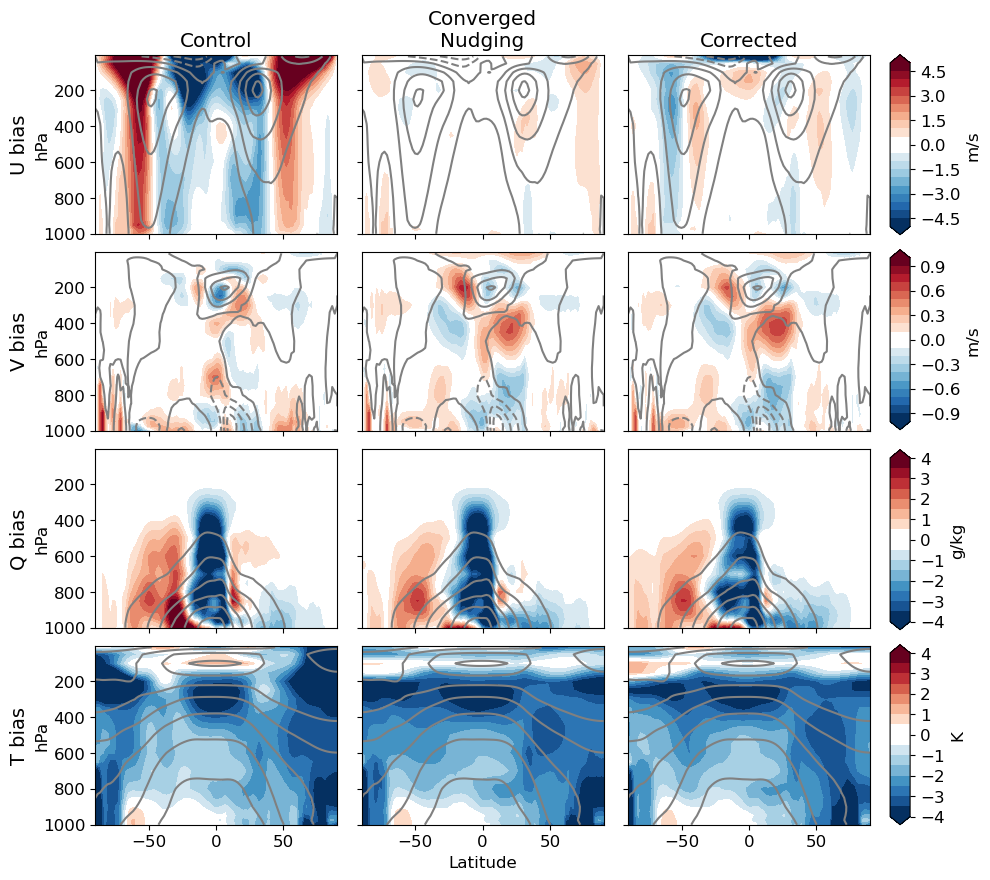

In [186]:
cases = [control_diff, nudge_diff, corrected_diff]
plot_lat_vs_level_bias_uvtq(cases, case_names, merra_ds, fig_dir / f'si_{TIME_LABEL}_latxlev_UV.png')

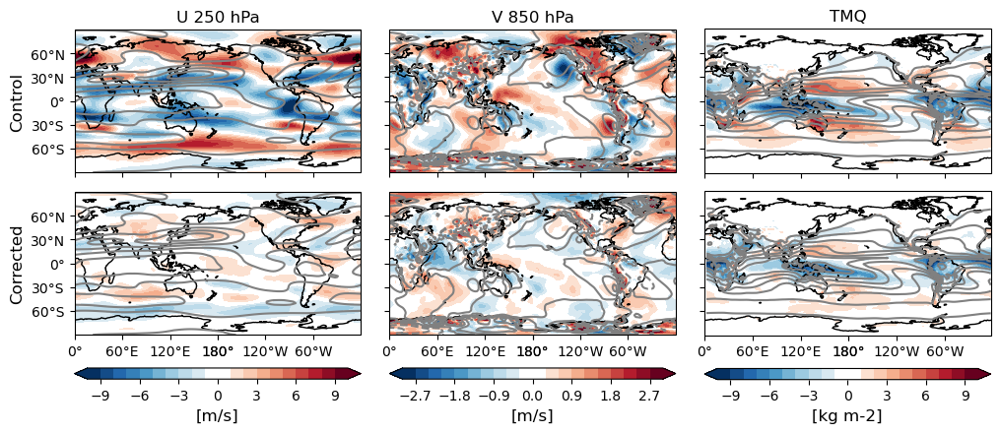

In [113]:
plot_configs = {'U': {'clev': np.arange(-10, 10.1, 1.),
                      'clab': '[m/s]','levels': [250]},
                'V': {'clev': np.arange(-3, 3.1, 0.3),
                      'clab': '[m/s]','levels': [850]},
                'TMQ': {'clev': np.arange(-10, 10.1, 1.),
                      'clab': '[kg m-2]','levels': [None]}}

cases = {"Control": control_diff, "Corrected": corrected_diff}
plot_lat_vs_lon_bias_comparison(cases, merra_ds, plot_configs, fig_dir / f'si_{TIME_LABEL}_lonxlat_UV.png')

In [114]:
MONTHS=[12,1,2]; TIME_LABEL='DJF'
control_pr, model_pr, gpcp_pr, ncep_pr, merra_pr = open_precip_files(control_dir, corrected_dir, analysis_years, MONTHS, climo_set='monave30')
models = [control_pr, model_pr]
case_names = ['Control','Corrected']
observations = [merra_pr]; obs_names = ['MERRA']

/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/cam_control_6hr/atm/hist/cam_control_6hr
/n/home04/sweidman/holylfs06/CESM2_corrector_out/Run/archive/apply_nudge30_uv/atm/hist/iter7/apply_nudge30_uv


tropical pattern correlation:  [[<xarray.DataArray ()> Size: 8B
array(0.88847364)], [<xarray.DataArray ()> Size: 8B
array(0.93583984)]]


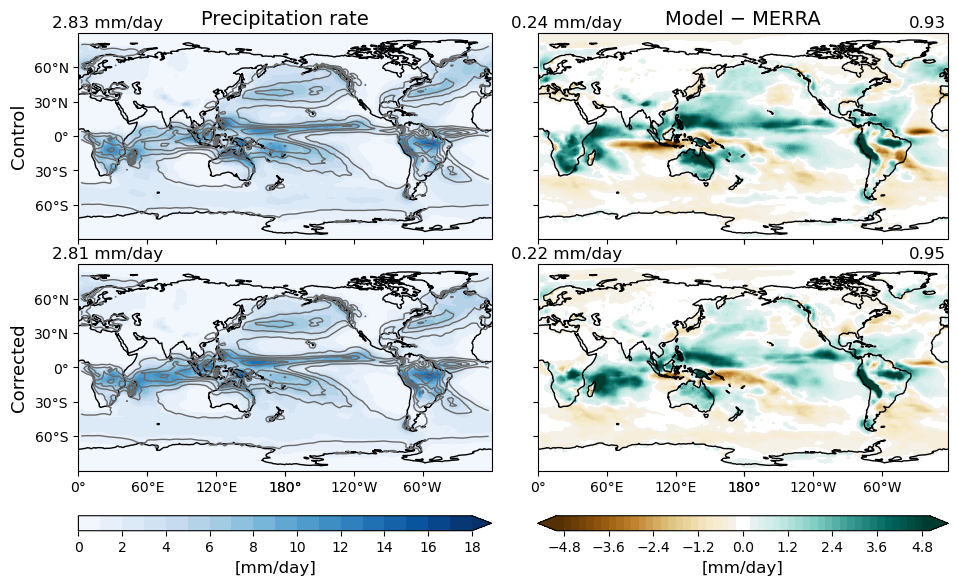

In [115]:
plot_lat_vs_lon_bias_pr(models, observations, case_names, obs_names, fig_dir / f'si_{TIME_LABEL}_pr_UV.png')